In [525]:
import requests
import datetime
import time
import csv
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score
from sklearn.dummy import DummyClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.neighbors import KNeighborsClassifier
from scipy.stats import randint
from imblearn.over_sampling import SMOTE
pd.set_option('display.max_columns', None)
plt.style.use('seaborn')
import xgboost as xgb
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'
from xgboost import XGBClassifier
import seaborn as sns
import pickle
import joblib

In [527]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [128]:
fighter1 = pd.read_csv('fighter1.csv')
fighter2 = pd.read_csv('fighter2.csv')

In [129]:
fighter1.drop(columns=['Unnamed: 0'], inplace=True)
fighter2.drop(columns=['Unnamed: 0'], inplace=True)

In [130]:
fighter1.drop_duplicates()

,fight,date,fighter_1,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,winner
0,Leandro Silva vs Charlie Brenneman,2014-11-08,Leandro-Silva,14.000000,127.0,159.0,14.0,5.0,0.000000,0.000000,0.775510,0.159812,0.704082,0.146044,0.009643,0.006409,0.035714,0.200000,0.010204,0.040816,0.000000,0.346939,0.132653,0.295918,0.683673,0.091837,0.000000,0,2,0.609756,2,69.0,155.0,72.0,28.0,1,0,0,1
1,Jon Jones vs Daniel Cormier,2015-01-03,Jon-Jones,82.200000,1419.0,1168.0,53.0,35.0,0.007096,0.000000,1.539772,0.453875,0.845349,0.194068,0.005770,0.008242,0.141967,0.291667,0.023926,0.051751,0.000000,0.864081,0.314560,0.361131,0.862241,0.246077,0.431453,14,1,0.609756,15,76.0,205.0,84.0,27.0,1,0,0,1
2,Marlon Vera vs Frankie Saenz,2019-03-23,Marlon-Vera,54.783333,807.0,964.0,25.0,26.0,0.005710,0.000000,1.211761,0.180450,1.440506,0.232817,0.005771,0.005252,0.123333,0.175916,0.021664,0.042691,0.000000,0.652580,0.309733,0.249448,0.780882,0.165348,0.265530,6,4,0.617284,10,68.0,135.0,70.0,26.0,0,0,1,1
3,Alex Oliveira vs James Moontasri,2016-07-23,Alex-Oliveira,21.483333,253.0,173.0,20.0,16.0,0.016333,0.000000,1.345555,0.427501,0.989875,0.197760,0.009170,0.015141,0.015625,0.187500,0.013299,0.056231,0.000000,0.888153,0.246254,0.211148,0.772143,0.527448,0.045964,3,2,0.666667,5,71.0,170.0,76.0,28.0,1,0,0,1
4,Karolina Kowalkiewicz vs Michelle Waterson,2019-03-30,Michelle-Waterson,32.766667,398.0,518.0,14.0,12.0,0.000000,0.000000,1.117159,0.147378,1.591522,0.408006,0.008188,0.004679,0.244048,0.187500,0.006587,0.026159,0.004360,0.531346,0.342690,0.243123,0.625972,0.295647,0.195539,4,2,0.408163,6,63.0,115.0,62.0,33.0,1,0,0,1
5,Joseph Benavidez vs Dustin Ortiz,2019-01-19,Joseph-Benavidez,92.716667,2030.0,1482.0,53.0,77.0,0.016273,0.000000,1.463462,0.333259,0.873614,0.124406,0.003085,0.006528,0.072216,0.143267,0.011724,0.069795,0.002609,0.835980,0.368797,0.258684,1.123083,0.186038,0.154342,13,3,0.787402,16,64.0,125.0,65.0,34.0,0,1,0,1
6,Urijah Faber vs Brad Pickett,2016-12-17,Urijah-Faber,91.066667,1641.0,1694.0,69.0,57.0,0.011275,0.000000,1.241575,0.366832,0.958663,0.153747,0.004216,0.005889,0.059213,0.111914,0.022423,0.027406,0.006887,0.890280,0.230164,0.121131,0.792866,0.161124,0.287584,9,6,0.757576,15,66.0,135.0,67.0,37.0,1,0,0,1
7,Sergio Moraes vs Omari Akhmedov,2015-12-10,Sergio-Moraes,22.383333,220.0,327.0,17.0,0.0,0.000000,0.000000,0.886933,0.199362,0.890069,0.187206,0.009764,0.007996,0.119430,NaN,0.022536,0.078108,0.000000,0.693928,0.115293,0.077712,0.699962,0.046941,0.140030,3,1,0.444444,4,72.0,170.0,72.0,33.0,1,0,0,1
8,Elizeu Zaleski dos Santos vs Curtis Millender,2019-03-09,Elizeu-Zaleski-dos-Santos,39.050000,774.0,761.0,26.0,23.0,0.017959,0.000000,1.453954,0.276499,1.147351,0.159301,0.003697,0.005982,0.093590,0.192547,0.005071,0.035750,0.005071,0.945633,0.306452,0.201869,0.847619,0.464244,0.142091,6,1,0.476190,7,71.0,170.0,73.0,32.0,1,0,0,1
9,Nikita Krylov vs Misha Cirkunov,2016-12-10,Misha-Cirkunov,10.583333,186.0,180.0,13.0,1.0,0.000000,0.000000,2.938102,0.740157,1.405829,0.122405,0.009697,0.011383,0.121795,1.000000,0.066372,0.319057,0.000000,2.289252,0.505866,0.142984,1.791165,0.732157,0.414780,3,0,0.531915,3,75.0,205.0,77.0,29.0,1,0,0,1


In [131]:
fighter1

,fight,date,fighter_1,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,winner
0,Leandro Silva vs Charlie Brenneman,2014-11-08,Leandro-Silva,14.000000,127.0,159.0,14.0,5.0,0.000000,0.000000,0.775510,0.159812,0.704082,0.146044,0.009643,0.006409,0.035714,0.200000,0.010204,0.040816,0.000000,0.346939,0.132653,0.295918,0.683673,0.091837,0.000000,0,2,0.609756,2,69.0,155.0,72.0,28.0,1,0,0,1
1,Jon Jones vs Daniel Cormier,2015-01-03,Jon-Jones,82.200000,1419.0,1168.0,53.0,35.0,0.007096,0.000000,1.539772,0.453875,0.845349,0.194068,0.005770,0.008242,0.141967,0.291667,0.023926,0.051751,0.000000,0.864081,0.314560,0.361131,0.862241,0.246077,0.431453,14,1,0.609756,15,76.0,205.0,84.0,27.0,1,0,0,1
2,Marlon Vera vs Frankie Saenz,2019-03-23,Marlon-Vera,54.783333,807.0,964.0,25.0,26.0,0.005710,0.000000,1.211761,0.180450,1.440506,0.232817,0.005771,0.005252,0.123333,0.175916,0.021664,0.042691,0.000000,0.652580,0.309733,0.249448,0.780882,0.165348,0.265530,6,4,0.617284,10,68.0,135.0,70.0,26.0,0,0,1,1
3,Alex Oliveira vs James Moontasri,2016-07-23,Alex-Oliveira,21.483333,253.0,173.0,20.0,16.0,0.016333,0.000000,1.345555,0.427501,0.989875,0.197760,0.009170,0.015141,0.015625,0.187500,0.013299,0.056231,0.000000,0.888153,0.246254,0.211148,0.772143,0.527448,0.045964,3,2,0.666667,5,71.0,170.0,76.0,28.0,1,0,0,1
4,Karolina Kowalkiewicz vs Michelle Waterson,2019-03-30,Michelle-Waterson,32.766667,398.0,518.0,14.0,12.0,0.000000,0.000000,1.117159,0.147378,1.591522,0.408006,0.008188,0.004679,0.244048,0.187500,0.006587,0.026159,0.004360,0.531346,0.342690,0.243123,0.625972,0.295647,0.195539,4,2,0.408163,6,63.0,115.0,62.0,33.0,1,0,0,1
5,Joseph Benavidez vs Dustin Ortiz,2019-01-19,Joseph-Benavidez,92.716667,2030.0,1482.0,53.0,77.0,0.016273,0.000000,1.463462,0.333259,0.873614,0.124406,0.003085,0.006528,0.072216,0.143267,0.011724,0.069795,0.002609,0.835980,0.368797,0.258684,1.123083,0.186038,0.154342,13,3,0.787402,16,64.0,125.0,65.0,34.0,0,1,0,1
6,Urijah Faber vs Brad Pickett,2016-12-17,Urijah-Faber,91.066667,1641.0,1694.0,69.0,57.0,0.011275,0.000000,1.241575,0.366832,0.958663,0.153747,0.004216,0.005889,0.059213,0.111914,0.022423,0.027406,0.006887,0.890280,0.230164,0.121131,0.792866,0.161124,0.287584,9,6,0.757576,15,66.0,135.0,67.0,37.0,1,0,0,1
7,Sergio Moraes vs Omari Akhmedov,2015-12-10,Sergio-Moraes,22.383333,220.0,327.0,17.0,0.0,0.000000,0.000000,0.886933,0.199362,0.890069,0.187206,0.009764,0.007996,0.119430,NaN,0.022536,0.078108,0.000000,0.693928,0.115293,0.077712,0.699962,0.046941,0.140030,3,1,0.444444,4,72.0,170.0,72.0,33.0,1,0,0,1
8,Elizeu Zaleski dos Santos vs Curtis Millender,2019-03-09,Elizeu-Zaleski-dos-Santos,39.050000,774.0,761.0,26.0,23.0,0.017959,0.000000,1.453954,0.276499,1.147351,0.159301,0.003697,0.005982,0.093590,0.192547,0.005071,0.035750,0.005071,0.945633,0.306452,0.201869,0.847619,0.464244,0.142091,6,1,0.476190,7,71.0,170.0,73.0,32.0,1,0,0,1
9,Nikita Krylov vs Misha Cirkunov,2016-12-10,Misha-Cirkunov,10.583333,186.0,180.0,13.0,1.0,0.000000,0.000000,2.938102,0.740157,1.405829,0.122405,0.009697,0.011383,0.121795,1.000000,0.066372,0.319057,0.000000,2.289252,0.505866,0.142984,1.791165,0.732157,0.414780,3,0,0.531915,3,75.0,205.0,77.0,29.0,1,0,0,1


In [132]:
fighter1[fighter1['fight'] == 'Yoel Romero vs Robert Whittaker']

,fight,date,fighter_1,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,winner
30,Yoel Romero vs Robert Whittaker,2018-06-09,Robert-Whittaker,63.433333,1322.0,1530.0,31.0,28.0,0.024681,0.007882,1.593541,0.200016,1.840612,0.335780,0.003691,0.004531,0.066308,0.220536,0.005875,0.014265,0.002252,1.053033,0.226759,0.313749,1.277430,0.178513,0.137598,10,2,0.523560,12,72.0,185.0,73.0,27.0,1,0,0,1
277,Yoel Romero vs Robert Whittaker,2018-06-09,Robert-Whittaker,63.433333,1322.0,1530.0,31.0,28.0,0.024681,0.007882,1.593541,0.200016,1.840612,0.335780,0.003691,0.004531,0.066308,0.220536,0.005875,0.014265,0.002252,1.053033,0.226759,0.313749,1.277430,0.178513,0.137598,10,2,0.523560,12,72.0,185.0,73.0,27.0,1,0,0,1
279,Yoel Romero vs Robert Whittaker,2017-07-08,Robert-Whittaker,54.433333,1215.0,1309.0,13.0,28.0,0.028762,0.009186,1.759038,0.221170,1.993887,0.362976,0.003646,0.004788,0.141026,0.220536,0.006846,0.016623,0.002624,1.186317,0.239757,0.332964,1.404949,0.201905,0.152184,9,2,0.523560,11,72.0,185.0,73.0,26.0,1,0,0,1
354,Yoel Romero vs Robert Whittaker,2018-06-09,Robert-Whittaker,63.433333,1322.0,1530.0,31.0,28.0,0.024681,0.007882,1.593541,0.200016,1.840612,0.335780,0.003691,0.004531,0.066308,0.220536,0.005875,0.014265,0.002252,1.053033,0.226759,0.313749,1.277430,0.178513,0.137598,10,2,0.714286,12,72.0,185.0,73.0,27.0,1,0,0,1
368,Yoel Romero vs Robert Whittaker,2018-06-09,Robert-Whittaker,63.433333,1322.0,1530.0,31.0,28.0,0.024681,0.007882,1.593541,0.200016,1.840612,0.335780,0.003691,0.004531,0.066308,0.220536,0.005875,0.014265,0.002252,1.053033,0.226759,0.313749,1.277430,0.178513,0.137598,10,2,0.714286,12,72.0,185.0,73.0,27.0,1,0,0,1
375,Yoel Romero vs Robert Whittaker,2018-06-09,Robert-Whittaker,63.433333,1322.0,1530.0,31.0,28.0,0.024681,0.007882,1.593541,0.200016,1.840612,0.335780,0.003691,0.004531,0.066308,0.220536,0.005875,0.014265,0.002252,1.053033,0.226759,0.313749,1.277430,0.178513,0.137598,10,2,0.523560,12,72.0,185.0,73.0,27.0,1,0,0,1
414,Yoel Romero vs Robert Whittaker,2017-07-08,Robert-Whittaker,54.433333,1215.0,1309.0,13.0,28.0,0.028762,0.009186,1.759038,0.221170,1.993887,0.362976,0.003646,0.004788,0.141026,0.220536,0.006846,0.016623,0.002624,1.186317,0.239757,0.332964,1.404949,0.201905,0.152184,9,2,0.714286,11,72.0,185.0,73.0,26.0,1,0,0,1
424,Yoel Romero vs Robert Whittaker,2017-07-08,Robert-Whittaker,54.433333,1215.0,1309.0,13.0,28.0,0.028762,0.009186,1.759038,0.221170,1.993887,0.362976,0.003646,0.004788,0.141026,0.220536,0.006846,0.016623,0.002624,1.186317,0.239757,0.332964,1.404949,0.201905,0.152184,9,2,0.523560,11,72.0,185.0,73.0,26.0,1,0,0,1
441,Yoel Romero vs Robert Whittaker,2017-07-08,Robert-Whittaker,54.433333,1215.0,1309.0,13.0,28.0,0.028762,0.009186,1.759038,0.221170,1.993887,0.362976,0.003646,0.004788,0.141026,0.220536,0.006846,0.016623,0.002624,1.186317,0.239757,0.332964,1.404949,0.201905,0.152184,9,2,0.523560,11,72.0,185.0,73.0,26.0,1,0,0,1
465,Yoel Romero vs Robert Whittaker,2018-06-09,Robert-Whittaker,63.433333,1322.0,1530.0,31.0,28.0,0.024681,0.007882,1.593541,0.200016,1.840612,0.335780,0.003691,0.004531,0.066308,0.220536,0.005875,0.014265,0.002252,1.053033,0.226759,0.313749,1.277430,0.178513,0.137598,10,2,0.523560,12,72.0,185.0,73.0,27.0,1,0,0,1


In [133]:
f2_ = fighter2.drop_duplicates(subset=['fight', 'date'])

In [134]:
f2_[f2_['fighter_2'] == 'Robert-Whittaker']

,fight,date,fighter_2,cumultime_2,cumulStr_Att_fighter_2,cumulStr_Att_oponent_2,cumulTD_Att_fighter_2,cumulTD_Att_oponent_2,KDPM_2,KDPM_ratio_2,SLPM_2,SLPM_ratio_2,SAPM_2,SAPM_ratio_2,Str_Acc_2,Str_Def_2,TD_Acc_2,TD_Def_2,SubPM_2,PassPM_2,RevPM_2,Head_SLPM_2,Body_SLPM_2,Leg_SLPM_2,Dist_SLPM_2,Clinch_SLPM_2,Ground_SLPM_2,wins_2,losses_2,implied_prob_2,prev_2,height_2,weight_2,reach_2,age_2,stance_Orthodox_2,stance_Southpaw_2,stance_Switch_2,winner
470,Robert Whittaker vs Israel Adesanya,2019-10-05,Robert-Whittaker,72.433333,1648.0,1770.0,32.0,38.0,0.021615,0.006903,1.591890,0.191084,1.782183,0.306031,0.003199,0.004220,0.064236,0.180921,0.005145,0.012492,0.001972,1.009628,0.233865,0.348396,1.301250,0.170138,0.120502,11,2,0.469484,13,72.0,185.0,73.0,28.0,1,0,0,1
925,Robert Whittaker vs Rafael Natal,2016-04-23,Robert-Whittaker,38.850000,945.0,1020.0,10.0,21.0,0.034046,0.012870,1.879148,0.224018,2.129934,0.318520,0.003286,0.004581,0.150000,0.198810,0.009593,0.017528,0.003677,1.252477,0.269362,0.357309,1.503664,0.214481,0.161003,6,2,0.740741,8,72.0,185.0,73.0,25.0,1,0,0,2
1063,Robert Whittaker vs Derek Brunson,2016-11-26,Robert-Whittaker,45.850000,1121.0,1157.0,10.0,25.0,0.028848,0.010905,1.869557,0.221125,1.997930,0.285084,0.003222,0.004512,0.150000,0.207000,0.008128,0.014852,0.003116,1.220163,0.259396,0.389999,1.532704,0.187967,0.148885,7,2,0.444444,9,72.0,185.0,73.0,25.0,1,0,0,2


In [135]:
f1_ = fighter1.drop_duplicates(subset=['fight', 'date'])

In [136]:
f1_[f1_['fighter_1'] == 'Robert-Whittaker']

,fight,date,fighter_1,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,winner
30,Yoel Romero vs Robert Whittaker,2018-06-09,Robert-Whittaker,63.433333,1322.0,1530.0,31.0,28.0,0.024681,0.007882,1.593541,0.200016,1.840612,0.335780,0.003691,0.004531,0.066308,0.220536,0.005875,0.014265,0.002252,1.053033,0.226759,0.313749,1.277430,0.178513,0.137598,10,2,0.523560,12,72.0,185.0,73.0,27.0,1,0,0,1
279,Yoel Romero vs Robert Whittaker,2017-07-08,Robert-Whittaker,54.433333,1215.0,1309.0,13.0,28.0,0.028762,0.009186,1.759038,0.221170,1.993887,0.362976,0.003646,0.004788,0.141026,0.220536,0.006846,0.016623,0.002624,1.186317,0.239757,0.332964,1.404949,0.201905,0.152184,9,2,0.523560,11,72.0,185.0,73.0,26.0,1,0,0,1
312,Brad Tavares vs Robert Whittaker,2015-05-09,Robert-Whittaker,31.116667,844.0,862.0,9.0,19.0,0.042508,0.016069,2.051925,0.251680,1.913449,0.189146,0.002774,0.004469,0.166667,0.193421,0.011977,0.021885,0.000000,1.485705,0.290396,0.275824,1.606078,0.249421,0.196426,4,2,0.429185,6,72.0,185.0,73.0,24.0,1,0,0,1


In [137]:
## was just checking the odds to make sure they are correct - still unsure why a few fights were duplicated
## seems that some were rematches

In [138]:
f1_

,fight,date,fighter_1,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,winner
0,Leandro Silva vs Charlie Brenneman,2014-11-08,Leandro-Silva,14.000000,127.0,159.0,14.0,5.0,0.000000,0.000000,0.775510,0.159812,0.704082,0.146044,0.009643,0.006409,0.035714,0.200000,0.010204,0.040816,0.000000,0.346939,0.132653,0.295918,0.683673,0.091837,0.000000,0,2,0.609756,2,69.0,155.0,72.0,28.0,1,0,0,1
1,Jon Jones vs Daniel Cormier,2015-01-03,Jon-Jones,82.200000,1419.0,1168.0,53.0,35.0,0.007096,0.000000,1.539772,0.453875,0.845349,0.194068,0.005770,0.008242,0.141967,0.291667,0.023926,0.051751,0.000000,0.864081,0.314560,0.361131,0.862241,0.246077,0.431453,14,1,0.609756,15,76.0,205.0,84.0,27.0,1,0,0,1
2,Marlon Vera vs Frankie Saenz,2019-03-23,Marlon-Vera,54.783333,807.0,964.0,25.0,26.0,0.005710,0.000000,1.211761,0.180450,1.440506,0.232817,0.005771,0.005252,0.123333,0.175916,0.021664,0.042691,0.000000,0.652580,0.309733,0.249448,0.780882,0.165348,0.265530,6,4,0.617284,10,68.0,135.0,70.0,26.0,0,0,1,1
3,Alex Oliveira vs James Moontasri,2016-07-23,Alex-Oliveira,21.483333,253.0,173.0,20.0,16.0,0.016333,0.000000,1.345555,0.427501,0.989875,0.197760,0.009170,0.015141,0.015625,0.187500,0.013299,0.056231,0.000000,0.888153,0.246254,0.211148,0.772143,0.527448,0.045964,3,2,0.666667,5,71.0,170.0,76.0,28.0,1,0,0,1
4,Karolina Kowalkiewicz vs Michelle Waterson,2019-03-30,Michelle-Waterson,32.766667,398.0,518.0,14.0,12.0,0.000000,0.000000,1.117159,0.147378,1.591522,0.408006,0.008188,0.004679,0.244048,0.187500,0.006587,0.026159,0.004360,0.531346,0.342690,0.243123,0.625972,0.295647,0.195539,4,2,0.408163,6,63.0,115.0,62.0,33.0,1,0,0,1
5,Joseph Benavidez vs Dustin Ortiz,2019-01-19,Joseph-Benavidez,92.716667,2030.0,1482.0,53.0,77.0,0.016273,0.000000,1.463462,0.333259,0.873614,0.124406,0.003085,0.006528,0.072216,0.143267,0.011724,0.069795,0.002609,0.835980,0.368797,0.258684,1.123083,0.186038,0.154342,13,3,0.787402,16,64.0,125.0,65.0,34.0,0,1,0,1
6,Urijah Faber vs Brad Pickett,2016-12-17,Urijah-Faber,91.066667,1641.0,1694.0,69.0,57.0,0.011275,0.000000,1.241575,0.366832,0.958663,0.153747,0.004216,0.005889,0.059213,0.111914,0.022423,0.027406,0.006887,0.890280,0.230164,0.121131,0.792866,0.161124,0.287584,9,6,0.757576,15,66.0,135.0,67.0,37.0,1,0,0,1
7,Sergio Moraes vs Omari Akhmedov,2015-12-10,Sergio-Moraes,22.383333,220.0,327.0,17.0,0.0,0.000000,0.000000,0.886933,0.199362,0.890069,0.187206,0.009764,0.007996,0.119430,NaN,0.022536,0.078108,0.000000,0.693928,0.115293,0.077712,0.699962,0.046941,0.140030,3,1,0.444444,4,72.0,170.0,72.0,33.0,1,0,0,1
8,Elizeu Zaleski dos Santos vs Curtis Millender,2019-03-09,Elizeu-Zaleski-dos-Santos,39.050000,774.0,761.0,26.0,23.0,0.017959,0.000000,1.453954,0.276499,1.147351,0.159301,0.003697,0.005982,0.093590,0.192547,0.005071,0.035750,0.005071,0.945633,0.306452,0.201869,0.847619,0.464244,0.142091,6,1,0.476190,7,71.0,170.0,73.0,32.0,1,0,0,1
9,Nikita Krylov vs Misha Cirkunov,2016-12-10,Misha-Cirkunov,10.583333,186.0,180.0,13.0,1.0,0.000000,0.000000,2.938102,0.740157,1.405829,0.122405,0.009697,0.011383,0.121795,1.000000,0.066372,0.319057,0.000000,2.289252,0.505866,0.142984,1.791165,0.732157,0.414780,3,0,0.531915,3,75.0,205.0,77.0,29.0,1,0,0,1


In [139]:
f2_

,fight,date,fighter_2,cumultime_2,cumulStr_Att_fighter_2,cumulStr_Att_oponent_2,cumulTD_Att_fighter_2,cumulTD_Att_oponent_2,KDPM_2,KDPM_ratio_2,SLPM_2,SLPM_ratio_2,SAPM_2,SAPM_ratio_2,Str_Acc_2,Str_Def_2,TD_Acc_2,TD_Def_2,SubPM_2,PassPM_2,RevPM_2,Head_SLPM_2,Body_SLPM_2,Leg_SLPM_2,Dist_SLPM_2,Clinch_SLPM_2,Ground_SLPM_2,wins_2,losses_2,implied_prob_2,prev_2,height_2,weight_2,reach_2,age_2,stance_Orthodox_2,stance_Southpaw_2,stance_Switch_2,winner
0,Leandro Silva vs Charlie Brenneman,2014-11-08,Charlie-Brenneman,40.883333,231.0,229.0,48.0,11.0,0.013977,0.000000,0.846688,0.422996,1.338457,0.651842,0.020701,0.019675,0.064608,0.500000,0.013977,0.148752,0.003494,0.405448,0.335118,0.106122,0.234423,0.149987,0.462278,4,6,0.400000,10,70.0,155.0,72.0,33.0,1,0,0,1
1,Jon Jones vs Daniel Cormier,2015-01-03,Daniel-Cormier,21.200000,325.0,218.0,8.0,5.0,0.035825,0.000000,1.706107,0.723729,0.846836,0.153420,0.006189,0.011381,0.200000,0.600000,0.016035,0.088193,0.000000,1.224436,0.373854,0.107817,0.660546,0.327374,0.718187,4,0,0.400000,4,71.0,235.0,72.0,35.0,1,0,0,1
2,Marlon Vera vs Frankie Saenz,2019-03-23,Frankie-Saenz,52.900000,879.0,908.0,26.0,76.0,0.004847,0.000000,1.137955,0.137926,1.282121,0.193901,0.004096,0.004561,0.042735,0.066829,0.005401,0.010802,0.002701,0.677344,0.317483,0.143127,0.799906,0.291101,0.046947,5,3,0.400000,8,66.0,135.0,66.0,38.0,1,0,0,1
3,Alex Oliveira vs James Moontasri,2016-07-23,James-Moontasri,17.350000,169.0,122.0,0.0,23.0,0.020764,0.000000,1.198715,0.321112,0.816544,0.233373,0.011168,0.016631,NaN,0.124638,0.020463,0.028697,0.000000,0.849117,0.212950,0.136648,0.411018,0.286780,0.500917,2,2,0.347222,4,70.0,170.0,71.0,28.0,0,0,1,1
4,Karolina Kowalkiewicz vs Michelle Waterson,2019-03-30,Karolina-Kowalkiewicz,49.016667,1400.0,1415.0,22.0,24.0,0.000000,0.000000,1.809788,0.173745,1.916593,0.220659,0.002191,0.003358,0.042929,0.145833,0.000000,0.014572,0.002914,1.259514,0.347847,0.202426,1.322359,0.452455,0.034974,5,3,0.591716,8,63.0,115.0,64.0,33.0,1,0,0,1
5,Joseph Benavidez vs Dustin Ortiz,2019-01-19,Dustin-Ortiz,75.450000,998.0,881.0,97.0,56.0,0.059087,0.000000,1.359259,0.389158,0.847364,0.164900,0.005982,0.008766,0.036731,0.098335,0.020425,0.058558,0.013959,0.946778,0.257063,0.155418,0.609414,0.220994,0.528851,8,5,0.229885,13,65.0,125.0,65.0,30.0,1,0,0,1
6,Urijah Faber vs Brad Pickett,2016-12-17,Brad-Pickett,63.083333,1467.0,1179.0,36.0,39.0,0.038927,0.015852,1.862441,0.713367,1.178299,0.133533,0.003576,0.006797,0.105556,0.142379,0.031910,0.052660,0.002265,1.474648,0.222144,0.165649,1.432049,0.172212,0.258180,5,7,0.229885,12,66.0,135.0,68.0,38.0,1,0,0,1
7,Sergio Moraes vs Omari Akhmedov,2015-12-10,Omari-Akhmedov,20.116667,241.0,172.0,11.0,12.0,0.014136,0.049710,0.793655,0.185589,0.754279,0.569680,0.006305,0.010269,0.141414,0.080556,0.000000,0.028271,0.000000,0.587786,0.135101,0.070767,0.404086,0.155760,0.233809,3,1,0.564972,4,72.0,185.0,73.0,28.0,1,0,0,1
8,Elizeu Zaleski dos Santos vs Curtis Millender,2019-03-09,Curtis-Millender,19.283333,365.0,326.0,2.0,9.0,0.000000,0.000000,1.264766,0.196582,1.083625,0.157212,0.003438,0.005465,1.000000,0.119048,0.000000,0.017224,0.000000,0.636929,0.162796,0.465042,1.190683,0.059267,0.014817,3,0,0.534759,3,74.0,170.0,76.0,31.0,1,0,0,1
9,Nikita Krylov vs Misha Cirkunov,2016-12-10,Nikita-Krylov,20.150000,348.0,257.0,5.0,15.0,0.075251,0.000000,4.024669,0.574431,3.764880,0.990808,0.011869,0.010560,0.100000,0.180952,0.135161,0.043778,0.011863,2.568825,0.839210,0.616634,2.098215,1.371991,0.554463,6,2,0.531915,8,75.0,205.0,77.0,24.0,1,0,0,1


In [140]:
real_model_df = pd.merge(f1_, f2_, how='inner', on=['fight', 'date', 'winner'])
real_model_df

,fight,date,fighter_1,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,winner,fighter_2,cumultime_2,cumulStr_Att_fighter_2,cumulStr_Att_oponent_2,cumulTD_Att_fighter_2,cumulTD_Att_oponent_2,KDPM_2,KDPM_ratio_2,SLPM_2,SLPM_ratio_2,SAPM_2,SAPM_ratio_2,Str_Acc_2,Str_Def_2,TD_Acc_2,TD_Def_2,SubPM_2,PassPM_2,RevPM_2,Head_SLPM_2,Body_SLPM_2,Leg_SLPM_2,Dist_SLPM_2,Clinch_SLPM_2,Ground_SLPM_2,wins_2,losses_2,implied_prob_2,prev_2,height_2,weight_2,reach_2,age_2,stance_Orthodox_2,stance_Southpaw_2,stance_Switch_2
0,Leandro Silva vs Charlie Brenneman,2014-11-08,Leandro-Silva,14.000000,127.0,159.0,14.0,5.0,0.000000,0.000000,0.775510,0.159812,0.704082,0.146044,0.009643,0.006409,0.035714,0.200000,0.010204,0.040816,0.000000,0.346939,0.132653,0.295918,0.683673,0.091837,0.000000,0,2,0.609756,2,69.0,155.0,72.0,28.0,1,0,0,1,Charlie-Brenneman,40.883333,231.0,229.0,48.0,11.0,0.013977,0.000000,0.846688,0.422996,1.338457,0.651842,0.020701,0.019675,0.064608,0.500000,0.013977,0.148752,0.003494,0.405448,0.335118,0.106122,0.234423,0.149987,0.462278,4,6,0.400000,10,70.0,155.0,72.0,33.0,1,0,0
1,Jon Jones vs Daniel Cormier,2015-01-03,Jon-Jones,82.200000,1419.0,1168.0,53.0,35.0,0.007096,0.000000,1.539772,0.453875,0.845349,0.194068,0.005770,0.008242,0.141967,0.291667,0.023926,0.051751,0.000000,0.864081,0.314560,0.361131,0.862241,0.246077,0.431453,14,1,0.609756,15,76.0,205.0,84.0,27.0,1,0,0,1,Daniel-Cormier,21.200000,325.0,218.0,8.0,5.0,0.035825,0.000000,1.706107,0.723729,0.846836,0.153420,0.006189,0.011381,0.200000,0.600000,0.016035,0.088193,0.000000,1.224436,0.373854,0.107817,0.660546,0.327374,0.718187,4,0,0.400000,4,71.0,235.0,72.0,35.0,1,0,0
2,Marlon Vera vs Frankie Saenz,2019-03-23,Marlon-Vera,54.783333,807.0,964.0,25.0,26.0,0.005710,0.000000,1.211761,0.180450,1.440506,0.232817,0.005771,0.005252,0.123333,0.175916,0.021664,0.042691,0.000000,0.652580,0.309733,0.249448,0.780882,0.165348,0.265530,6,4,0.617284,10,68.0,135.0,70.0,26.0,0,0,1,1,Frankie-Saenz,52.900000,879.0,908.0,26.0,76.0,0.004847,0.000000,1.137955,0.137926,1.282121,0.193901,0.004096,0.004561,0.042735,0.066829,0.005401,0.010802,0.002701,0.677344,0.317483,0.143127,0.799906,0.291101,0.046947,5,3,0.400000,8,66.0,135.0,66.0,38.0,1,0,0
3,Alex Oliveira vs James Moontasri,2016-07-23,Alex-Oliveira,21.483333,253.0,173.0,20.0,16.0,0.016333,0.000000,1.345555,0.427501,0.989875,0.197760,0.009170,0.015141,0.015625,0.187500,0.013299,0.056231,0.000000,0.888153,0.246254,0.211148,0.772143,0.527448,0.045964,3,2,0.666667,5,71.0,170.0,76.0,28.0,1,0,0,1,James-Moontasri,17.350000,169.0,122.0,0.0,23.0,0.020764,0.000000,1.198715,0.321112,0.816544,0.233373,0.011168,0.016631,NaN,0.124638,0.020463,0.028697,0.000000,0.849117,0.212950,0.136648,0.411018,0.286780,0.500917,2,2,0.347222,4,70.0,170.0,71.0,28.0,0,0,1
4,Karolina Kowalkiewicz vs Michelle Waterson,2019-03-30,Michelle-Waterson,32.766667,398.0,518.0,14.0,12.0,0.000000,0.000000,1.117159,0.147378,1.591522,0.408006,0.008188,0.004679,0.244048,0.187500,0.006587,0.026159,0.004360,0.531346,0.342690,0.243123,0.625972,0.295647,0.195539,4,2,0.408163,6,63.0,115.0,62.0,33.0,1,0,0,1,Karolina-Kowalkiewicz,49.016667,1400.0,1415.0,22.0,24.0,0.000000,0.000000,1.809788,0.173745,1.916593,0.220659,0.002191,0.003358,0.042929,0.145833,0.000000,0.014572,0.002914,1.259514,0.347847,0.202426,1.322359,0.452455,0.034974,5,3,0.591716,8,63.0,115.0,64.0,33.0,1,0,0
5,Joseph Benavidez vs Dustin Ortiz,2019-01-19,Joseph-Benavidez,92.716667,2030.0,1482.0,53.0,77.0,0.016273,0.000000,1.463462,0.333259,0.873614,0.124406,0.003085,0.006528,0.072216,0.143267,0.011724,0.069795,0.002609,0.835980,0.368797,0.258684,1.123083,0.186038,0.154342,13,3

In [141]:
real = real_model_df.sort_values(by='date')

In [40]:
##need to get rid of first 6 fights because they are mixed with the odds from rematches from a later date

In [142]:
real = real[6:]

In [143]:
real

,fight,date,fighter_1,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,winner,fighter_2,cumultime_2,cumulStr_Att_fighter_2,cumulStr_Att_oponent_2,cumulTD_Att_fighter_2,cumulTD_Att_oponent_2,KDPM_2,KDPM_ratio_2,SLPM_2,SLPM_ratio_2,SAPM_2,SAPM_ratio_2,Str_Acc_2,Str_Def_2,TD_Acc_2,TD_Def_2,SubPM_2,PassPM_2,RevPM_2,Head_SLPM_2,Body_SLPM_2,Leg_SLPM_2,Dist_SLPM_2,Clinch_SLPM_2,Ground_SLPM_2,wins_2,losses_2,implied_prob_2,prev_2,height_2,weight_2,reach_2,age_2,stance_Orthodox_2,stance_Southpaw_2,stance_Switch_2
139,Michael Bisping vs Alan Belcher,2013-04-27,Michael-Bisping,97.650000,2153.0,1614.0,57.0,64.0,0.009493,0.000000,1.639309,0.851981,0.857162,0.116763,0.003429,0.007578,0.117630,0.113814,0.009724,0.029810,0.006168,1.227733,0.252894,0.158682,1.057864,0.264832,0.316612,13,5,0.636943,18,73.0,185.0,75.0,34.0,1,0,0,1,Alan-Belcher,67.116667,689.0,883.0,14.0,47.0,0.010150,0.000000,1.048896,0.324575,1.157549,0.415793,0.007723,0.008540,0.260204,0.130733,0.036897,0.021842,0.002128,0.669179,0.128152,0.251566,0.682603,0.217053,0.149240,9,5,0.222222,14,74.0,185.0,73.0,29.0,1,0,0
421,Cody McKenzie vs Leonard Garcia,2013-04-27,Cody-McKenzie,16.016667,138.0,138.0,3.0,12.0,0.000000,0.000000,0.745647,0.220418,1.482906,1.018825,0.008149,0.021224,0.666667,0.064815,0.164509,0.098560,0.081161,0.370464,0.136707,0.238475,0.561489,0.033749,0.150409,2,3,0.341297,5,72.0,155.0,72.0,25.0,0,0,1,1,Leonard-Garcia,52.350000,1162.0,1443.0,11.0,22.0,0.002729,0.000000,1.435287,0.721779,1.098403,0.176125,0.003110,0.003658,0.142857,0.135281,0.015290,0.044787,0.016936,1.060195,0.290189,0.084903,1.169095,0.058234,0.207958,2,6,0.653595,8,70.0,145.0,69.0,33.0,1,0,0
698,Phil Davis vs Vinny Magalhaes,2013-04-27,Vinny-Magalhaes,11.533333,181.0,213.0,5.0,3.0,0.000000,0.000000,0.882517,0.136364,1.692821,0.599923,0.005774,0.006771,0.233333,0.222222,0.000000,0.037159,0.000000,0.414283,0.392251,0.075983,0.538100,0.155293,0.189125,1,2,0.281690,3,75.0,205.0,79.0,28.0,1,0,0,2,Phil-Davis,44.316667,539.0,383.0,39.0,13.0,0.000000,0.000000,0.733896,0.787983,0.500354,0.706087,0.004443,0.011265,0.081261,0.100000,0.022976,0.091768,0.000000,0.321167,0.296803,0.115926,0.259911,0.128241,0.345743,6,1,0.735294,7,74.0,205.0,79.0,28.0,1,0,0
722,Roy Nelson vs Cheick Kongo,2013-04-27,Cheick-Kongo,78.383333,872.0,434.0,36.0,57.0,0.014649,0.006379,1.314818,0.838135,0.499828,0.106282,0.010685,0.020703,0.201389,0.097076,0.005468,0.026809,0.005468,0.624191,0.349858,0.340769,0.437787,0.474887,0.402143,11,5,0.312500,16,76.0,240.0,82.0,37.0,1,0,0,2,Roy-Nelson,32.716667,635.0,399.0,8.0,17.0,0.105803,0.000000,2.115989,0.481302,1.202177,0.233459,0.006005,0.011538,0.125000,0.073529,0.000000,0.020668,0.000000,1.633077,0.359080,0.123832,1.443897,0.336220,0.335872,5,3,0.699301,8,72.0,263.0,72.0,36.0,1,0,0
197,Bryan Caraway vs Johnny Bedford,2013-04-27,Bryan-Caraway,15.283333,187.0,237.0,24.0,7.0,0.000000,0.000000,0.867837,0.146396,1.364465,0.330292,0.005851,0.007108,0.062500,0.400000,0.041395,0.188282,0.000000,0.616757,0.110064,0.141016,0.690843,0.099747,0.077248,2,1,0.465116,3,68.0,135.0,68.0,28.0,1,0,0,1,Johnny-Bedford,5.966667,89.0,155.0,3.0,6.0,0.167598,0.000000,3.102671,1.436844,3.799822,2.310220,0.008692,0.007404,0.333333,0.055556,0.000000,0.083799,0.000000,2.389324,0.335196,0.378151,1.425285,0.420403,1.256983,2,0,0.523560,2,70.0,135.0,71.0,30.0,1,0,0
628,Jon Jones vs Chael Sonnen,2013-04-27,Jon-Jones,59.650000,939.0,673.0,30.0,22.0,0.009779,0.000000,1.541516,0.505503,0.839194,0.242203,0.006650,0.011419,0.214444,0.378788,0.029245,0.071314,0.000000,0.869142,0.320013,0.352360,0.767227,0.238722,0.535567,11,1,0.884956,12,76.0,205.0,84.0,25.0

In [144]:
real.to_csv('realmodeldf.csv')

In [145]:
bloop = real.drop(['fight', 'date', 'fighter_1', 'fighter_2'], axis=1)
bloop.columns

Index(['cumultime_1', 'cumulStr_Att_fighter_1', 'cumulStr_Att_oponent_1',
       'cumulTD_Att_fighter_1', 'cumulTD_Att_oponent_1', 'KDPM_1',
       'KDPM_ratio_1', 'SLPM_1', 'SLPM_ratio_1', 'SAPM_1', 'SAPM_ratio_1',
       'Str_Acc_1', 'Str_Def_1', 'TD_Acc_1', 'TD_Def_1', 'SubPM_1', 'PassPM_1',
       'RevPM_1', 'Head_SLPM_1', 'Body_SLPM_1', 'Leg_SLPM_1', 'Dist_SLPM_1',
       'Clinch_SLPM_1', 'Ground_SLPM_1', 'wins_1', 'losses_1',
       'implied_prob_1', 'prev_1', 'height_1', 'weight_1', 'reach_1', 'age_1',
       'stance_Orthodox_1', 'stance_Southpaw_1', 'stance_Switch_1', 'winner',
       'cumultime_2', 'cumulStr_Att_fighter_2', 'cumulStr_Att_oponent_2',
       'cumulTD_Att_fighter_2', 'cumulTD_Att_oponent_2', 'KDPM_2',
       'KDPM_ratio_2', 'SLPM_2', 'SLPM_ratio_2', 'SAPM_2', 'SAPM_ratio_2',
       'Str_Acc_2', 'Str_Def_2', 'TD_Acc_2', 'TD_Def_2', 'SubPM_2', 'PassPM_2',
       'RevPM_2', 'Head_SLPM_2', 'Body_SLPM_2', 'Leg_SLPM_2', 'Dist_SLPM_2',
       'Clinch_SLPM_2', 'Ground_SL

In [146]:
bloop

,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,winner,cumultime_2,cumulStr_Att_fighter_2,cumulStr_Att_oponent_2,cumulTD_Att_fighter_2,cumulTD_Att_oponent_2,KDPM_2,KDPM_ratio_2,SLPM_2,SLPM_ratio_2,SAPM_2,SAPM_ratio_2,Str_Acc_2,Str_Def_2,TD_Acc_2,TD_Def_2,SubPM_2,PassPM_2,RevPM_2,Head_SLPM_2,Body_SLPM_2,Leg_SLPM_2,Dist_SLPM_2,Clinch_SLPM_2,Ground_SLPM_2,wins_2,losses_2,implied_prob_2,prev_2,height_2,weight_2,reach_2,age_2,stance_Orthodox_2,stance_Southpaw_2,stance_Switch_2
139,97.650000,2153.0,1614.0,57.0,64.0,0.009493,0.000000,1.639309,0.851981,0.857162,0.116763,0.003429,0.007578,0.117630,0.113814,0.009724,0.029810,0.006168,1.227733,0.252894,0.158682,1.057864,0.264832,0.316612,13,5,0.636943,18,73.0,185.0,75.0,34.0,1,0,0,1,67.116667,689.0,883.0,14.0,47.0,0.010150,0.000000,1.048896,0.324575,1.157549,0.415793,0.007723,0.008540,0.260204,0.130733,0.036897,0.021842,0.002128,0.669179,0.128152,0.251566,0.682603,0.217053,0.149240,9,5,0.222222,14,74.0,185.0,73.0,29.0,1,0,0
421,16.016667,138.0,138.0,3.0,12.0,0.000000,0.000000,0.745647,0.220418,1.482906,1.018825,0.008149,0.021224,0.666667,0.064815,0.164509,0.098560,0.081161,0.370464,0.136707,0.238475,0.561489,0.033749,0.150409,2,3,0.341297,5,72.0,155.0,72.0,25.0,0,0,1,1,52.350000,1162.0,1443.0,11.0,22.0,0.002729,0.000000,1.435287,0.721779,1.098403,0.176125,0.003110,0.003658,0.142857,0.135281,0.015290,0.044787,0.016936,1.060195,0.290189,0.084903,1.169095,0.058234,0.207958,2,6,0.653595,8,70.0,145.0,69.0,33.0,1,0,0
698,11.533333,181.0,213.0,5.0,3.0,0.000000,0.000000,0.882517,0.136364,1.692821,0.599923,0.005774,0.006771,0.233333,0.222222,0.000000,0.037159,0.000000,0.414283,0.392251,0.075983,0.538100,0.155293,0.189125,1,2,0.281690,3,75.0,205.0,79.0,28.0,1,0,0,2,44.316667,539.0,383.0,39.0,13.0,0.000000,0.000000,0.733896,0.787983,0.500354,0.706087,0.004443,0.011265,0.081261,0.100000,0.022976,0.091768,0.000000,0.321167,0.296803,0.115926,0.259911,0.128241,0.345743,6,1,0.735294,7,74.0,205.0,79.0,28.0,1,0,0
722,78.383333,872.0,434.0,36.0,57.0,0.014649,0.006379,1.314818,0.838135,0.499828,0.106282,0.010685,0.020703,0.201389,0.097076,0.005468,0.026809,0.005468,0.624191,0.349858,0.340769,0.437787,0.474887,0.402143,11,5,0.312500,16,76.0,240.0,82.0,37.0,1,0,0,2,32.716667,635.0,399.0,8.0,17.0,0.105803,0.000000,2.115989,0.481302,1.202177,0.233459,0.006005,0.011538,0.125000,0.073529,0.000000,0.020668,0.000000,1.633077,0.359080,0.123832,1.443897,0.336220,0.335872,5,3,0.699301,8,72.0,263.0,72.0,36.0,1,0,0
197,15.283333,187.0,237.0,24.0,7.0,0.000000,0.000000,0.867837,0.146396,1.364465,0.330292,0.005851,0.007108,0.062500,0.400000,0.041395,0.188282,0.000000,0.616757,0.110064,0.141016,0.690843,0.099747,0.077248,2,1,0.465116,3,68.0,135.0,68.0,28.0,1,0,0,1,5.966667,89.0,155.0,3.0,6.0,0.167598,0.000000,3.102671,1.436844,3.799822,2.310220,0.008692,0.007404,0.333333,0.055556,0.000000,0.083799,0.000000,2.389324,0.335196,0.378151,1.425285,0.420403,1.256983,2,0,0.523560,2,70.0,135.0,71.0,30.0,1,0,0
628,59.650000,939.0,673.0,30.0,22.0,0.009779,0.000000,1.541516,0.505503,0.839194,0.242203,0.006650,0.011419,0.214444,0.378788,0.029245,0.071314,0.000000,0.869142,0.320013,0.352360,0.767227,0.238722,0.535567,11,1,0.884956,12,76.0,205.0,84.0,25.0,1,0,0,1,54.833333,838.0,424.0,62.0,11.0,0.000000,0.000000,1.174828,0.692265,0.454521,0.075973,0.005956,0.014321,0.088707,0.310606,0.006305,0.091724,0.002545,0.754830,0.198422,0.221575,0.364914,0.182866,0.627048,6,4,0.111111,10,73.0,205.0,74.0,36.0,0,1,0
35,106.533333,1271.0,1247.0,122.0,53.0,0.002102,0.000000,0.620552,0.224362,0.650120,0.210207,0.005023,0.009627,0.072532,0.202680,0.027105,0.087095,0.005029,0.491468,0.07

In [147]:
bloop.fillna(0, inplace=True)
bloop.to_csv('needs_to_be_standardized_for_model.csv')
B = bloop.copy()
for col in B.columns:
    B[col] = (B[col]-min(B[col])) / (max(B[col]) - min(B[col])) #subtract the minimum and divide by the range forcing a scale of 0 to 1 for each feature
B

,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,winner,cumultime_2,cumulStr_Att_fighter_2,cumulStr_Att_oponent_2,cumulTD_Att_fighter_2,cumulTD_Att_oponent_2,KDPM_2,KDPM_ratio_2,SLPM_2,SLPM_ratio_2,SAPM_2,SAPM_ratio_2,Str_Acc_2,Str_Def_2,TD_Acc_2,TD_Def_2,SubPM_2,PassPM_2,RevPM_2,Head_SLPM_2,Body_SLPM_2,Leg_SLPM_2,Dist_SLPM_2,Clinch_SLPM_2,Ground_SLPM_2,wins_2,losses_2,implied_prob_2,prev_2,height_2,weight_2,reach_2,age_2,stance_Orthodox_2,stance_Southpaw_2,stance_Switch_2
139,0.607277,0.564805,0.493546,0.329480,0.418301,0.006548,0.000000,0.127380,0.333148,0.084095,0.021359,0.021356,0.030455,0.117630,0.113814,0.016575,0.050660,0.013504,0.133185,0.119194,0.119227,0.143176,0.057900,0.072473,0.565217,0.384615,0.652527,0.533333,0.545455,0.466667,0.892857,0.56,1.0,0.0,0.0,0.0,0.396456,0.171999,0.285387,0.077348,0.265537,0.007814,0.000000,0.094032,0.084612,0.136813,0.127918,0.121760,0.058060,0.260204,0.130733,0.099006,0.024588,0.022558,0.067839,0.042077,0.095537,0.090502,0.051936,0.018323,0.391304,0.357143,0.167633,0.413793,0.608696,0.466667,0.541667,0.346154,1.0,0.0,0.0
421,0.081571,0.033983,0.039951,0.017341,0.078431,0.000000,0.000000,0.047701,0.080864,0.165719,0.224424,0.064248,0.103989,0.666667,0.064815,0.280430,0.167498,0.177698,0.040188,0.064433,0.179181,0.075994,0.007378,0.034429,0.086957,0.230769,0.307379,0.100000,0.500000,0.266667,0.857143,0.20,0.0,0.0,1.0,0.0,0.303555,0.293064,0.468454,0.060773,0.124294,0.002101,0.000000,0.132033,0.196291,0.129236,0.051707,0.033187,0.016802,0.142857,0.135281,0.041028,0.050416,0.179483,0.110770,0.095280,0.032244,0.155002,0.013934,0.025532,0.086957,0.428571,0.665516,0.206897,0.434783,0.200000,0.375000,0.500000,1.0,0.0,0.0
698,0.052699,0.045311,0.062999,0.028902,0.019608,0.000000,0.000000,0.059904,0.047287,0.193101,0.130124,0.042666,0.026105,0.233333,0.222222,0.000000,0.063151,0.000000,0.044941,0.184876,0.057090,0.072829,0.033952,0.043291,0.043478,0.153846,0.237792,0.033333,0.636364,0.600000,0.940476,0.32,1.0,0.0,0.0,1.0,0.253015,0.133606,0.121935,0.215470,0.073446,0.000000,0.000000,0.063053,0.214904,0.052627,0.220228,0.058789,0.081091,0.081261,0.100000,0.061653,0.103302,0.000000,0.029630,0.097451,0.044025,0.034460,0.030685,0.042449,0.260870,0.071429,0.759812,0.172414,0.608696,0.600000,0.791667,0.307692,1.0,0.0,0.0
722,0.483203,0.227345,0.130916,0.208092,0.372549,0.010104,0.062194,0.098448,0.327617,0.037482,0.019000,0.087300,0.101182,0.201389,0.097076,0.009320,0.045560,0.011971,0.067712,0.164895,0.256040,0.059252,0.103825,0.092051,0.478261,0.384615,0.273761,0.466667,0.681818,0.833333,0.976190,0.68,1.0,0.0,0.0,1.0,0.180036,0.158178,0.127166,0.044199,0.096045,0.081453,0.000000,0.198978,0.128677,0.142530,0.069938,0.088771,0.083391,0.125000,0.073529,0.000000,0.023266,0.000000,0.173668,0.117899,0.047028,0.191436,0.080450,0.041237,0.217391,0.214286,0.718269,0.206897,0.521739,0.986667,0.500000,0.615385,1.0,0.0,0.0
197,0.076849,0.046891,0.070375,0.138728,0.045752,0.000000,0.000000,0.058596,0.051295,0.150269,0.069427,0.043365,0.027923,0.062500,0.400000,0.070564,0.319977,0.000000,0.066906,0.051875,0.105953,0.093502,0.021808,0.017682,0.086957,0.076923,0.451931,0.033333,0.318182,0.133333,0.809524,0.32,1.0,0.0,0.0,0.0,0.011744,0.018428,0.047401,0.016575,0.033898,0.129025,0.000000,0.296015,0.397340,0.475283,0.730323,0.140366,0.048458,0.333333,0.055556,0.000000,0.094331,0.000000,0.256698,0.110057,0.143610,0.188969,0.100593,0.154327,0.086957,0.000000,0.515433,0.000000,0.434783,0.133333,0.458333,0.384615,1.0,0.0,0.0
628,0.362563,0.244995,0.204364,0.173410,0.143791,0.006745,0.000000,0.118661,0.194744,0.081751,0.049597,0.050627,0.051153,0.21444

In [148]:
B['win'] = B['winner']
B.drop(columns=['winner'], inplace=True)
B

,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,cumultime_2,cumulStr_Att_fighter_2,cumulStr_Att_oponent_2,cumulTD_Att_fighter_2,cumulTD_Att_oponent_2,KDPM_2,KDPM_ratio_2,SLPM_2,SLPM_ratio_2,SAPM_2,SAPM_ratio_2,Str_Acc_2,Str_Def_2,TD_Acc_2,TD_Def_2,SubPM_2,PassPM_2,RevPM_2,Head_SLPM_2,Body_SLPM_2,Leg_SLPM_2,Dist_SLPM_2,Clinch_SLPM_2,Ground_SLPM_2,wins_2,losses_2,implied_prob_2,prev_2,height_2,weight_2,reach_2,age_2,stance_Orthodox_2,stance_Southpaw_2,stance_Switch_2,win
139,0.607277,0.564805,0.493546,0.329480,0.418301,0.006548,0.000000,0.127380,0.333148,0.084095,0.021359,0.021356,0.030455,0.117630,0.113814,0.016575,0.050660,0.013504,0.133185,0.119194,0.119227,0.143176,0.057900,0.072473,0.565217,0.384615,0.652527,0.533333,0.545455,0.466667,0.892857,0.56,1.0,0.0,0.0,0.396456,0.171999,0.285387,0.077348,0.265537,0.007814,0.000000,0.094032,0.084612,0.136813,0.127918,0.121760,0.058060,0.260204,0.130733,0.099006,0.024588,0.022558,0.067839,0.042077,0.095537,0.090502,0.051936,0.018323,0.391304,0.357143,0.167633,0.413793,0.608696,0.466667,0.541667,0.346154,1.0,0.0,0.0,0.0
421,0.081571,0.033983,0.039951,0.017341,0.078431,0.000000,0.000000,0.047701,0.080864,0.165719,0.224424,0.064248,0.103989,0.666667,0.064815,0.280430,0.167498,0.177698,0.040188,0.064433,0.179181,0.075994,0.007378,0.034429,0.086957,0.230769,0.307379,0.100000,0.500000,0.266667,0.857143,0.20,0.0,0.0,1.0,0.303555,0.293064,0.468454,0.060773,0.124294,0.002101,0.000000,0.132033,0.196291,0.129236,0.051707,0.033187,0.016802,0.142857,0.135281,0.041028,0.050416,0.179483,0.110770,0.095280,0.032244,0.155002,0.013934,0.025532,0.086957,0.428571,0.665516,0.206897,0.434783,0.200000,0.375000,0.500000,1.0,0.0,0.0,0.0
698,0.052699,0.045311,0.062999,0.028902,0.019608,0.000000,0.000000,0.059904,0.047287,0.193101,0.130124,0.042666,0.026105,0.233333,0.222222,0.000000,0.063151,0.000000,0.044941,0.184876,0.057090,0.072829,0.033952,0.043291,0.043478,0.153846,0.237792,0.033333,0.636364,0.600000,0.940476,0.32,1.0,0.0,0.0,0.253015,0.133606,0.121935,0.215470,0.073446,0.000000,0.000000,0.063053,0.214904,0.052627,0.220228,0.058789,0.081091,0.081261,0.100000,0.061653,0.103302,0.000000,0.029630,0.097451,0.044025,0.034460,0.030685,0.042449,0.260870,0.071429,0.759812,0.172414,0.608696,0.600000,0.791667,0.307692,1.0,0.0,0.0,1.0
722,0.483203,0.227345,0.130916,0.208092,0.372549,0.010104,0.062194,0.098448,0.327617,0.037482,0.019000,0.087300,0.101182,0.201389,0.097076,0.009320,0.045560,0.011971,0.067712,0.164895,0.256040,0.059252,0.103825,0.092051,0.478261,0.384615,0.273761,0.466667,0.681818,0.833333,0.976190,0.68,1.0,0.0,0.0,0.180036,0.158178,0.127166,0.044199,0.096045,0.081453,0.000000,0.198978,0.128677,0.142530,0.069938,0.088771,0.083391,0.125000,0.073529,0.000000,0.023266,0.000000,0.173668,0.117899,0.047028,0.191436,0.080450,0.041237,0.217391,0.214286,0.718269,0.206897,0.521739,0.986667,0.500000,0.615385,1.0,0.0,0.0,1.0
197,0.076849,0.046891,0.070375,0.138728,0.045752,0.000000,0.000000,0.058596,0.051295,0.150269,0.069427,0.043365,0.027923,0.062500,0.400000,0.070564,0.319977,0.000000,0.066906,0.051875,0.105953,0.093502,0.021808,0.017682,0.086957,0.076923,0.451931,0.033333,0.318182,0.133333,0.809524,0.32,1.0,0.0,0.0,0.011744,0.018428,0.047401,0.016575,0.033898,0.129025,0.000000,0.296015,0.397340,0.475283,0.730323,0.140366,0.048458,0.333333,0.055556,0.000000,0.094331,0.000000,0.256698,0.110057,0.143610,0.188969,0.100593,0.154327,0.086957,0.000000,0.515433,0.000000,0.434783,0.133333,0.458333,0.384615,1.0,0.0,0.0,0.0
628,0.362563,0.244995,0.204364,0.173410,0.143791,0.006745,0.000000,0.118661,0.194744,0.081751,0.049597,0.050627,0.051153,0.214444,0

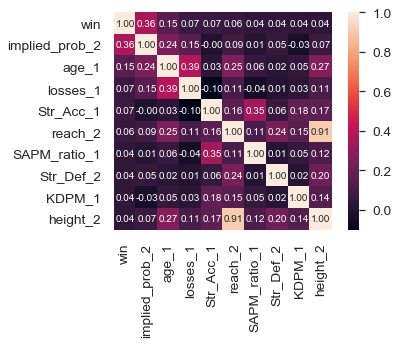

In [149]:
# Subset Correlation Matrix
n = 10 #number of variables for heatmap
corrmat = B.corr()
cols = corrmat.nlargest(n, 'win')['win'].index
cm = np.corrcoef(B[cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()

In [150]:
y = B.loc[:, 'win']
X = B.iloc[:, 0:-1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=45)

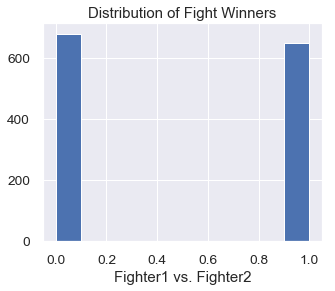

In [151]:
y.hist(figsize=(5,4))
plt.title('Distribution of Fight Winners')
plt.xlabel('Fighter1 vs. Fighter2')
plt.savefig('Distribution_Winners.png')

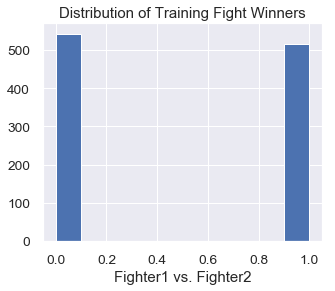

In [152]:
y_train.hist(figsize=(5,4))
plt.title('Distribution of Training Fight Winners')
plt.xlabel('Fighter1 vs. Fighter2')
plt.savefig('Distribution_Train_Winners.png')

In [153]:
#print metrics function
def print_metrics(test, preds):
    print("Precision Score: {}".format(precision_score(test, preds)))
    print("Recall Score: {}".format(recall_score(test, preds)))
    print("Accuracy Score: {}".format(accuracy_score(test, preds)))
    print("F1 Score: {}".format(f1_score(test, preds)))

#function to look at importance of features
def plot_feature_importances(model):
    n_features = X_train.shape[1]
    plt.figure(figsize=(20,20))
    plt.barh(range(n_features), model.feature_importances_, align='center') 
    plt.yticks(np.arange(n_features), X_train.columns.values) 
    plt.xlabel("Feature importance")
    plt.ylabel("Feature")

# Dummy Classifier

In [154]:
# Fitting and training the dummy
dummy = DummyClassifier(strategy='stratified', random_state=20)
dummy.fit(X_train, y_train)

# Dummy predictions
dum_pred = dummy.predict(X_test)

#Printing out results
print_metrics(y_test, dum_pred)

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, dum_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.46853146853146854
Recall Score: 0.5114503816793893
Accuracy Score: 0.47368421052631576
F1 Score: 0.4890510948905109

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,59,76,135
1.0,64,67,131
All,123,143,266


# Logistic Regression

In [155]:
#logistic regression
logreg = LogisticRegression(fit_intercept = False, C = 1e16, random_state=20)
model_log = logreg.fit(X_train, y_train)
model_log

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1e+16, class_weight=None, dual=False, fit_intercept=False,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=20, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [156]:
y_pred = logreg.predict(X_test)

#Printing out results
print_metrics(y_test, y_pred)

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.6141732283464567
Recall Score: 0.5954198473282443
Accuracy Score: 0.6165413533834586
F1 Score: 0.6046511627906976

AUC is :0.62

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,86,49,135
1.0,53,78,131
All,139,127,266


Test AUC: 0.7057958722080859
train AUC: 0.7502199614577657


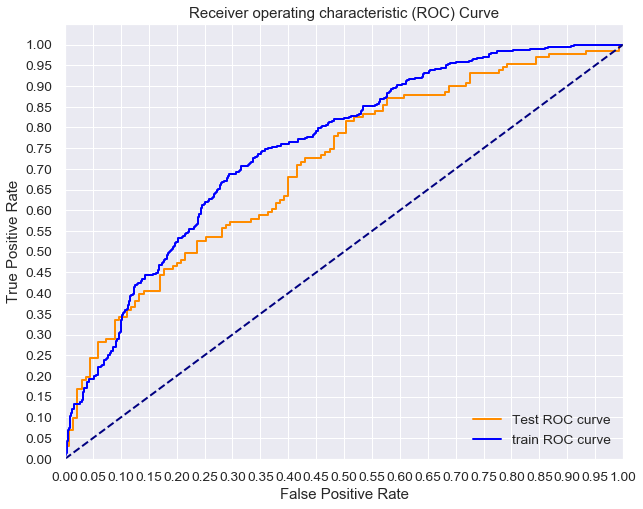

In [157]:
y_test_score = logreg.decision_function(X_test)
y_train_score = logreg.decision_function(X_train)

test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_score)
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_score)

print('Test AUC: {}'.format(auc(test_fpr, test_tpr)))
print('train AUC: {}'.format(auc(train_fpr, train_tpr)))

plt.figure(figsize=(10,8))
lw = 2
plt.plot(test_fpr, test_tpr, color='darkorange',
         lw=lw, label='Test ROC curve')
plt.plot(train_fpr, train_tpr, color='blue',
         lw=lw, label='train ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

#  Random Forest

In [158]:
forest = RandomForestClassifier(random_state=20)
forest.fit(X_train, y_train)

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=20, verbose=0,
                       warm_start=False)

In [159]:
y_pred = forest.predict(X_test)

#Printing out results
print_metrics(y_test, y_pred)

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.580952380952381
Recall Score: 0.46564885496183206
Accuracy Score: 0.5714285714285714
F1 Score: 0.5169491525423731

AUC is :0.57

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,91,44,135
1.0,70,61,131
All,161,105,266


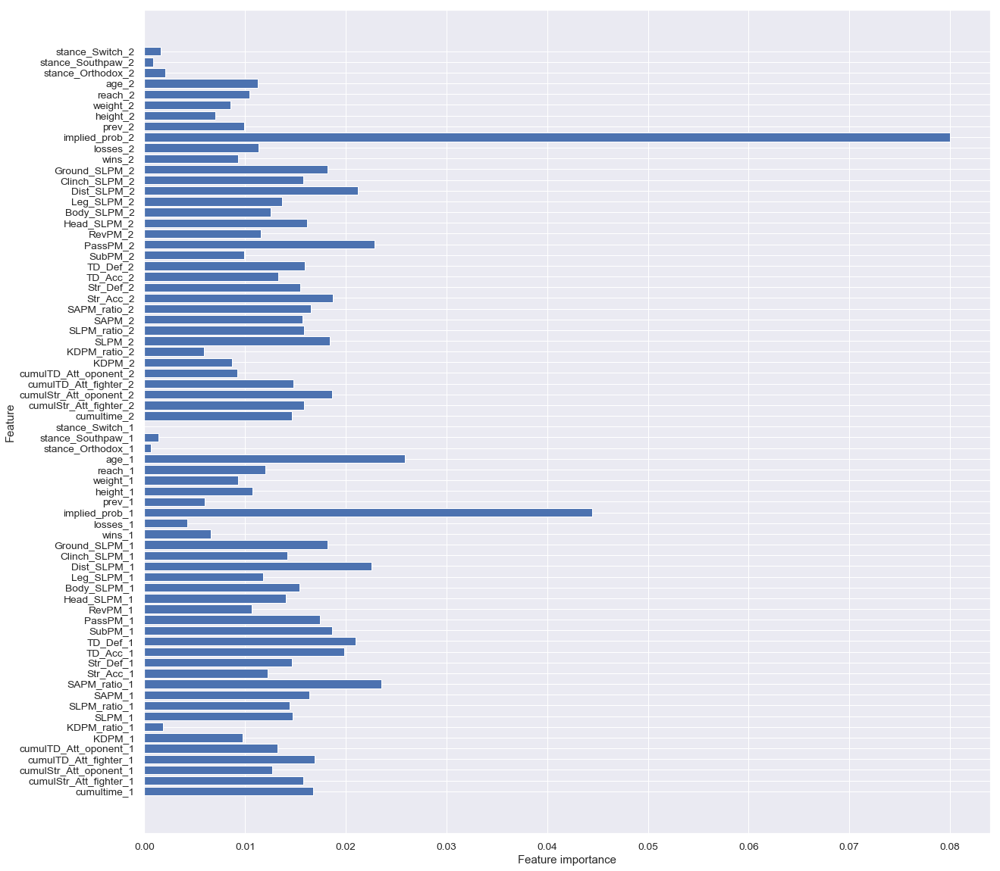

In [160]:
plot_feature_importances(forest)

### Grid Search on RF

In [161]:
##first running randomized search

param_distrib = {'max_depth': randint(1, 50),
                 'max_features': randint(1, 16),
                 'min_samples_split': randint(2, 1000),
                 'min_samples_leaf': randint(2, 1000),
                 'n_estimators': [10, 100]
                }
clf = RandomizedSearchCV(RandomForestClassifier(), param_distrib, n_iter=1000)
clf.fit(X, y)
clf.best_params_

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


{'max_depth': 44,
 'max_features': 12,
 'min_samples_leaf': 205,
 'min_samples_split': 83,
 'n_estimators': 10}

In [162]:
##running randomized search 2nd time

param_distrib = {'max_depth': randint(1, 50),
                 'max_features': randint(1, 16),
                 'min_samples_split': randint(2, 1000),
                 'min_samples_leaf': randint(2, 1000),
                 'n_estimators': [10, 100]
                }
clf = RandomizedSearchCV(RandomForestClassifier(), param_distrib, n_iter=1000)
clf.fit(X, y)
clf.best_params_

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


{'max_depth': 16,
 'max_features': 15,
 'min_samples_leaf': 176,
 'min_samples_split': 371,
 'n_estimators': 10}

In [163]:
##running randomized search third time

param_distrib = {'max_depth': randint(1, 50),
                 'max_features': randint(1, 16),
                 'min_samples_split': randint(2, 1000),
                 'min_samples_leaf': randint(2, 1000),
                 'n_estimators': randint(10, 100)
                }
clf = RandomizedSearchCV(RandomForestClassifier(), param_distrib, n_iter=1000)
clf.fit(X, y)
clf.best_params_

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


{'max_depth': 32,
 'max_features': 11,
 'min_samples_leaf': 84,
 'min_samples_split': 92,
 'n_estimators': 17}

In [166]:
#creating grid for grid search for random forest

rf_param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 2, 5, 10, 15, 20],
    'max_features': [None, 2, 10, 15, 20, 30],
    'min_samples_split': [2, 10, 50, 75, 100, 125],
    'min_samples_leaf': [25, 50, 100, 150, 200],
    'n_estimators': [10, 50, 100, 150],
}


rf_grid_search = GridSearchCV(forest, rf_param_grid, cv=3, return_train_score=True, verbose=3)
rf_grid_search.fit(X, y)

Fitting 3 folds for each of 8640 candidates, totalling 25920 fits
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.771, test=0.649), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.808, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s remaining:    0.0s


[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.766, test=0.620), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.827, test=0.658), total=   1.0s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.816, test=0.618), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.803, test=0.604), total=   0.6s
[CV

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.810, test=0.611), total=   1.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.839, test=0.656), total=   1.8s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.814, test=0.624), total=   2.0s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.810, test=0.613), tot

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.752, test=0.658), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.745, test=0.604), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.745, test=0.611), total=   0.7s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.768, test=0.658), t

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.761, test=0.663), total=   1.7s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.733, test=0.600), total=   1.3s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.767, test=0.613), total=   2.3s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.725, test=0.661), total

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.739, test=0.663), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.742, test=0.602), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.755, test=0.624), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.758, test=0.663), t

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.673, test=0.663), total=   0.9s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.686, test=0.604), total=   0.9s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.692, test=0.645), total=   0.8s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.676, test=0.674), tot

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.683, test=0.652), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.675, test=0.665), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.704, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.689, test=0.656), tot

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.690, test=0.604), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.696, test=0.649), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.673, test=0.663), total=   0.9s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.686, te

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.646, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.673, test=0.600), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.646, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.643, test=0.672), t

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.646, test=0.643), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.643, test=0.672), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.672, test=0.597), total=   0.7s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.646, te

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.632, test=0.665), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.672, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.640, test=0.654), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.631, test=0.665), t

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.640, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.630, test=0.667), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.672, test=0.597), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.641, test=0.65

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.822, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.819, test=0.649), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.810, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.834, test=0.577), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.830, test=0.577), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.717, test=0.624), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.729, test=0.604), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.725, test=0.579), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.766, test=0.588), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.779, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.773, test=0.572), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.784, test=0.602), total=   0.1s
[CV]

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.749, test=0.575), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.698, test=0.611), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.687, test=0.590), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.695, test=0.584), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.747, test=0.593), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.785, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.743, test=0.577), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.745, test=0.593), total=   0.1s
[CV]

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.708, test=0.584), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.626, test=0.622), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.640, test=0.570), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.640, test=0.566), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.682, test=0.595), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.672, test=0.548), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.704, test=0.570), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.697, test=0.590), total=   0.1s
[CV

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.583, test=0.527), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.586, test=0.527), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.612, test=0.545), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.614, test=0.554), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.635, test=0.557), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.594, test=0.588), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.618, test=0.543), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.600, test=0.559), total=   0.0s
[CV] crit

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.586, test=0.527), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.614, test=0.554), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.624, test=0.545), total=   0.

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.567, test=0.523), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.540, test=0.541), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.557, test=0.498), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.550, test=0.489), total=   0.0s
[CV] crit

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.559, test=0.534), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.572, test=0.525), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.555, test=0.518), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.559, test=0.532), total=   0

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.787, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.786, test=0.629), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.793, test=0.640), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.801, test=0.658), total=   0.3s
[CV] cri

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.792, test=0.658), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.775, test=0.629), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.773, test=0.620), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.712, test=0.638), total=   0.0s
[CV

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.741, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.727, test=0.624), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.718, test=0.604), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.747, test=0.672), total=   0.2s
[CV] criterion=

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.745, test=0.674), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.732, test=0.629), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.742, test=0.613), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.708, test=0.606), total=   0.0s
[CV] 

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.727, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.714, test=0.624), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.717, test=0.606), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.739, test=0.670), total=   0.2s
[

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.693, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.702, test=0.624), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.710, test=0.633), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.683, test=0.656), total=   0.0

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.688, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.704, test=0.624), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.700, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.704, test=0.624), total=

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.691, test=0.606), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.670, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.643, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.636, test=0.631), total=   0.0s
[CV

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.667, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.674, test=0.638), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.676, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.687, test=0.618), total=   0.2s

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.691, test=0.606), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.670, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.626, test=0.572), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.622, test=0.568), total=   0.0s
[

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.655, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.664, test=0.636), total=   0.

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.665, test=0.645), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.626, test=0.572), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.622, test=0.568), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.615, test=0.561), total=   

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.791, test=0.638), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.803, test=0.656), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.790, test=0.622), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.794, test=0.624), total=   0.5s
[CV]

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.777, test=0.611), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.734, test=0.663), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.739, test=0.658), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.743, test=0.624), total=   0.0s
[CV

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.736, test=0.636), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.734, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.722, test=0.622), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.744, test=0.627), total=   0.3s
[CV] criter

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.748, test=0.627), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.696, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.716, test=0.629), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.723, test=0.640), total=   0.0s
[CV] crit

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.729, test=0.661), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.726, test=0.620), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.739, test=0.627), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.730, test=0.661), total=   0

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.697, test=0.613), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.686, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.682, test=0.665), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.695, test=0.618), total=   0.3s

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.690, test=0.618), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.698, test=0.636), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.658, test=0.633), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.700, test=0.633), total= 

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.656, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.679, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.669, test=0.638), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.657, test=0.672), total=   0

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.675, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.654, test=0.645), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.656, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.679, test=0.611), total=

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.667, test=0.600), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.648, test=0.647), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.630, test=0.584), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.622, test=0.566), total=   0.0s
[CV

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.672, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.649, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.653, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.671, test=0.597), total=   0.1s

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.667, test=0.600), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.648, test=0.647), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.776, test=0.663), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.766, test=0.631), total=   0.0s
[CV] 

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.793, test=0.624), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.802, test=0.652), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.794, test=0.631), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.801, test=0.615), total=   0.4s
[CV]

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.761, test=0.611), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.726, test=0.672), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.743, test=0.620), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.727, test=0.602), total=   0.0s
[C

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.756, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.736, test=0.667), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.727, test=0.636), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.751, test=0.633), total=   0.3s
[CV]

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.751, test=0.624), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.724, test=0.645), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.721, test=0.624), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.724, test=0.636), total=   0.0s
[CV

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.695, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.671, test=0.663), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.679, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.697, test=0.640), total=   0.3s
[CV]

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.706, test=0.629), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.686, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.697, test=0.615), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.679, test=0.611), total=   0.0s
[C

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.695, test=0.633), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.671, test=0.663), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.679, test=0.611), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.697, test=0.640), tota

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.658, test=0.654), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.658, test=0.643), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.669, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.666, test=0.638), total=   0.0s
[C

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.657, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.669, test=0.602), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.661, test=0.656), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.647, test=0.672), tot

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.665, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.649, test=0.658), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.645, test=0.670), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.669, test=0.597), total=   0.2s

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.666, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.639, test=0.649), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.660, test=0.667), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.671, test=0.615), total=   0

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.805, test=0.631), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.814, test=0.622), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.819, test=0.658), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.800, test=0.633), total=   0.5s
[CV] criterio

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.799, test=0.636), total=   0.8s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.809, test=0.604), total=   1.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.759, test=0.665), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.774, test=0.604), total=   0.1s
[CV] cr

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.744, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.742, test=0.622), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.752, test=0.658), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.733, test=0.622), total=   0.4s

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.741, test=0.624), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.759, test=0.618), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.710, test=0.640), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.747, test=0.640), total=   0.0s
[CV] cr

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.741, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.755, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.743, test=0.663), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.734, test=0.622), total=   0.4s

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.683, test=0.604), total=   0.7s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.701, test=0.636), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.673, test=0.638), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.665, test=0.609), total=   0.0s
[CV

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.683, test=0.595), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.687, test=0.652), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.664, test=0.679), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.679, test=0.600), total=   0.4s

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.683, test=0.604), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.701, test=0.636), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.660, test=0.663), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.672, test=0.604), total=   0.0s
[

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.653, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.637, test=0.674), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.669, test=0.600), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.658, test=0.645), total=   0.

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.660, test=0.640), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.660, test=0.663), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.672, test=0.604), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.652, test=0.633), total=   

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.635, test=0.661), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.669, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.637, test=0.658), total=   0.

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.639, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.636, test=0.661), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.672, test=0.609), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.649, test=0.652), total=   0

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.686, test=0.629), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.633, test=0.654), total=   0.6s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.673, test=0.597), total=   0.6s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.680, test=0.627), total=   0.6s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.679, test=0.624), total=   0.8s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.632, test=0.658), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.672, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.650, test=0.640), total=   0.1s
[CV] criterion=g

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.686, test=0.629), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.633, test=0.654), total=   0.7s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.673, test=0.597), total=   0.6s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.680, test=0.627), total=   0.6s
[CV]

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.670, test=0.624), total=   0.9s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.632, test=0.658), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.672, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.650, test=0.640), total=   0.1s
[CV] criterion=g

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.684, test=0.627), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.632, test=0.656), total=   0.7s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.673, test=0.597), total=   0.6s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.673, test=0.627), total=   0.5s
[CV]

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.647, test=0.631), total=   0.7s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.627, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.672, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.652, test=0.636), total=   0.1s
[CV] crite

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.649, test=0.640), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.635, test=0.656), total=   0.5s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.674, test=0.600), total=   0.5s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.647, test=0.631), total=   0.5s
[CV]

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.647, test=0.631), total=   0.8s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.653, test=0.679), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.672, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.646, test=0.636), total=   0.1s
[CV] criterion

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.646, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.643, test=0.672), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.673, test=0.600), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.646, test=0.643), total=   0.8s
[CV]

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.646, test=0.636), total=   0.7s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.653, test=0.679), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.672, test=0.602), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.646, test=0.636), total=   0.1s
[C

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.640, test=0.654), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.631, test=0.665), total=   0.5s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.671, test=0.602), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.640, test=0.656), total=   0.3s
[CV]

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.641, test=0.654), total=   0.8s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.632, test=0.665), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.672, test=0.602), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.644, test=0.658), total=   0.1s
[CV

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.690, test=0.534), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.698, test=0.586), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.690, test=0.536), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.708, test=0.552), total=   0.1s
[CV] criterion=gini, max_depth=2, max_f

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.678, test=0.538), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.692, test=0.590), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.692, test=0.536), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.713, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=2

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.683, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.681, test=0.595), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.678, test=0.552), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.701, test=0.568), total=   0.1s
[CV] criterion=gini, max_depth=2, max_f

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.663, test=0.559), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.672, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.674, test=0.557), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.683, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=2, max_

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.690, test=0.566), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.701, test=0.563), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.615, test=0.640), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.623, test=0.561), total=   0.0s
[CV] criterion=gini, max_depth=2

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.649, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.644, test=0.579), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.658, test=0.536), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.665, test=0.577), total=   0.3s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.623, test=0.561), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.637, test=0.590), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.641, test=0.584), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.663, test=0.548), total=   0.1s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.624, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.633, test=0.566), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.638, test=0.545), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.635, test=0.557), total=   0.2s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.586, test=0.527), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.614, test=0.554), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.624, test=0.545), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.550, test=0.514), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.535, test=0.520), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.559, test=0.534), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.572, test=0.525), total=   0.2s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.567, test=0.523), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.540, test=0.541), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.557, test=0.498), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.550, test=0.489), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.715, test=0.622), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.705, test=0.620), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.686, test=0.654), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.699, test=0.629), total=   0.4s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.708, test=0.618), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.701, test=0.618), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.674, test=0.663), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.709, test=0.622), total=   0.2s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.693, test=0.627), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.658, test=0.640), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.686, test=0.595), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.669, test=0.638), total=   0.0s
[CV] criterion=gini, max_depth=2, m

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.700, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.697, test=0.615), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.707, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.689, test=0.679), total=   0.2s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.699, test=0.622), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.689, test=0.613), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.696, test=0.674), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.705, test=0.620), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.688, test=0.640), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.666, test=0.654), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.679, test=0.613), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.675, test=0.606), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.680, test=0.663), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.702, test=0.622), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.684, test=0.640), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.678, test=0.667), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.667, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.674, test=0.638), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.676, test=0.670), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.687, test=0.618), total=   0.1s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.691, test=0.606), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.670, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.643, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.636, test=0.631), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.655, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.664, test=0.636), total=   0.1s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.655, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.664, test=0.636), total=   0.2s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.665, test=0.645), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.671, test=0.649), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.675, test=0.629), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.687, test=0.604), total=   0.0s
[CV] criterion=gini, max_depth=2, 

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.664, test=0.654), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.699, test=0.613), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.693, test=0.627), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.665, test=0.658), total=   0.3s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.687, test=0.624), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.682, test=0.620), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.663, test=0.649), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.695, test=0.624), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.692, test=0.622), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.654, test=0.629), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.662, test=0.577), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.679, test=0.606), total=   0.0s
[CV] criterion=gini, max_depth

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.678, test=0.661), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.687, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.689, test=0.624), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.673, test=0.656), total=   0.3s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.682, test=0.624), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.666, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.665, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.687, test=0.627), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.680, test=0.624), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.679, test=0.627), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.669, test=0.624), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.692, test=0.606), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.675, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.654, test=0.645), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.656, test=0.667), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.679, test=0.611), total=   0.2s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.667, test=0.643), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.655, test=0.645), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.660, test=0.618), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.650, test=0.622), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.654, test=0.645), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.656, test=0.667), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.679, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.669, test=0.638), total=   0.2s
[CV] criter

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.630, test=0.584), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.622, test=0.566), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.614, test=0.577), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.662, test=0.667), total=   0.1s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.653, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.671, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.649, test=0.645), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.657, test=0.670), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.647, test=0.663), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.679, test=0.606), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.684, test=0.618), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.646, test=0.658), total=   0.3s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.673, test=0.611), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.682, test=0.620), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.649, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.679, test=0.618), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.656, test=0.661), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.674, test=0.609), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.675, test=0.622), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.649, test=0.658), total=   0.4s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.660, test=0.652), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.678, test=0.604), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.682, test=0.618), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.656, test=0.661), total=   0.2s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.674, test=0.609), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.686, test=0.615), total=   0.7s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.661, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.689, test=0.613), total=   0.0s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.654, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.671, test=0.606), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.672, test=0.627), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.653, test=0.667), total=   0.3s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.669, test=0.606), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.673, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.654, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.671, test=0.606), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.658, test=0.654), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.658, test=0.643), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.669, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.666, test=0.638), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.662, test=0.645), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.657, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.669, test=0.602), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.661, test=0.656), total=   0.3s
[CV] criter

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.639, test=0.649), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.660, test=0.667), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.671, test=0.615), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.648, test=0.624), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.645, test=0.670), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.669, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.641, test=0.649), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.646, test=0.670), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.653, test=0.656), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.672, test=0.604), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.660, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.653, test=0.665), total=   0.3s
[CV] criterion=gini, max_depth=2, ma

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.672, test=0.602), total=   0.5s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.683, test=0.620), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.647, test=0.654), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.687, test=0.622), total=   0.0s
[CV] criterion=gini, max_dep

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.664, test=0.618), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.653, test=0.661), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.674, test=0.600), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.682, test=0.613), total=   0.3s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.653, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.672, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.664, test=0.618), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.649, test=0.656), total=   0.3s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.672, test=0.602), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.684, test=0.620), total=   0.5s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.647, test=0.638), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.657, test=0.620), total=   0.0s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.666, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.652, test=0.672), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.674, test=0.602), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.681, test=0.633), total=   0.2s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.678, test=0.624), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.650, test=0.654), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.657, test=0.615), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.672, test=0.654), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.653, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.637, test=0.674), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.669, test=0.600), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.658, test=0.645), total=   0.2s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.633, test=0.676), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.653, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.637, test=0.674), total=   0.3s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.633, test=0.674), total=   0.6s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.669, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.660, test=0.640), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.636, test=0.661), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.670, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.635, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.669, test=0.597), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.670, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.639, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.636, test=0.661), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.672, test=0.609), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.785, test=0.615), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.764, test=0.613), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.798, test=0.661), total=   1.0s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.794, test=0.620), total=   1.0s
[CV] criterio

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.767, test=0.609), total=   1.6s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.750, test=0.618), total=   1.7s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.717, test=0.647), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.747, test=0.606), total=   0.1s
[CV] crite

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.747, test=0.602), total=   0.6s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.747, test=0.624), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.753, test=0.663), total=   1.1s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.733, test=0.604), total=   1.1s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.732, test=0.597), total=   1.9s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.759, test=0.602), total=   1.4s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.722, test=0.654), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.749, test=0.602), total=   0.1s
[CV] criterion

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.724, test=0.593), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.740, test=0.627), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.736, test=0.667), total=   1.0s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.719, test=0.602), total=   1.0s
[CV] c

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.686, test=0.604), total=   0.9s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.692, test=0.645), total=   0.8s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.676, test=0.674), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.704, test=0.584), total=   0.1s
[CV] cr

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.704, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.689, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.672, test=0.667), total=   0.6s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.690, test=0.604), total=   0.6s

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.672, test=0.597), total=   0.8s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.646, test=0.636), total=   0.8s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.653, test=0.679), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.672, test=0.602), total=   0.1s
[CV] crite

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.673, test=0.600), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.646, test=0.643), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.643, test=0.672), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.673, test=0.600), total=   0.8s
[CV] c

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.672, test=0.597), total=   0.7s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.646, test=0.636), total=   1.1s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.632, test=0.665), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.672, test=0.602), total=   0.1s
[CV] cri

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.640, test=0.654), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.631, test=0.665), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.671, test=0.602), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.640, test=0.656), total=   0.3s
[CV]

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.641, test=0.654), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.632, test=0.665), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.672, test=0.602), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.644, test=0.658), total=   0.0s
[C

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.799, test=0.649), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.784, test=0.590), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.798, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.810, test=0.658), total=   0.2s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.686, test=0.570), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.717, test=0.590), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.769, test=0.624), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.764, test=0.557), total=   0.4s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.744, test=0.588), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.776, test=0.643), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.747, test=0.586), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.749, test=0.579), total=   0.3s
[CV] criterion=gini, max_depth=5, max_

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.771, test=0.649), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.736, test=0.557), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.742, test=0.586), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.794, test=0.652), total=   0.2s
[CV] criterion=gini, max_depth=5, ma

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.748, test=0.570), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.626, test=0.622), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.640, test=0.570), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.640, test=0.566), total=   0.0s
[CV] criterion=gini, max_depth=5, ma

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.672, test=0.548), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.704, test=0.570), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.697, test=0.590), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.693, test=0.575), total=   0.1s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.683, test=0.572), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.682, test=0.595), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.672, test=0.548), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.704, test=0.570), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.586, test=0.527), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.614, test=0.554), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.624, test=0.545), total=   0.1s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.584, test=0.536), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.583, test=0.527), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.586, test=0.527), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.580, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.567, test=0.523), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.540, test=0.541), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.557, test=0.498), total=   0.0s
[CV] criterion=gini, max_dep

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.559, test=0.534), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.572, test=0.525), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.555, test=0.518), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.559, test=0.532), total=   0.1s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.768, test=0.665), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.768, test=0.636), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.751, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.776, test=0.654), total=   0.3s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.750, test=0.624), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.750, test=0.611), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.704, test=0.647), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.730, test=0.613), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.712, test=0.604), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.739, test=0.665), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.733, test=0.629), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.730, test=0.609), total=   0.2s
[CV] criterion=gini, max_depth=5

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.738, test=0.654), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.725, test=0.606), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.712, test=0.604), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.739, test=0.665), total=   0.2s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.722, test=0.618), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.732, test=0.618), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.683, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.676, test=0.604), total=   0.0s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.704, test=0.624), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.700, test=0.661), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.704, test=0.624), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.709, test=0.647), total=   0.2s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.710, test=0.633), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.683, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.676, test=0.604), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.690, test=0.595), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.676, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.687, test=0.618), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.665, test=0.627), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.670, test=0.661), total=   0.3s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.636, test=0.631), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.654, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.662, test=0.670), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.667, test=0.615), total=   0.5s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.664, test=0.636), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.687, test=0.661), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.680, test=0.586), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.665, test=0.645), total=   0.2s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.655, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.664, test=0.636), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.734, test=0.658), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.756, test=0.629), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.749, test=0.624), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.759, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=5, max_

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.761, test=0.631), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.761, test=0.611), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.761, test=0.665), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.767, test=0.624), total=   0.4s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.736, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.739, test=0.618), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.735, test=0.622), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.742, test=0.656), total=   0.3s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.719, test=0.627), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.743, test=0.624), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.699, test=0.661), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.713, test=0.620), total=   0.0s
[CV] criterion=gini, max_dep

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.726, test=0.640), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.730, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.722, test=0.620), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.740, test=0.629), total=   0.3s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.697, test=0.613), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.686, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.682, test=0.665), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.695, test=0.618), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.690, test=0.618), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.698, test=0.636), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.658, test=0.633), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.700, test=0.633), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.675, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.654, test=0.645), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.656, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.679, test=0.611), total=   0.2s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.667, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.655, test=0.645), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.660, test=0.618), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.650, test=0.622), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.656, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.679, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.669, test=0.638), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.657, test=0.672), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.672, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.649, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.653, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.671, test=0.597), total=   0.1s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.667, test=0.600), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.648, test=0.647), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.630, test=0.584), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.622, test=0.566), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.759, test=0.622), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.756, test=0.656), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.758, test=0.633), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.760, test=0.613), total=   0.4s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.738, test=0.640), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.743, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.753, test=0.606), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.740, test=0.656), total=   0.4s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.721, test=0.627), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.750, test=0.622), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.721, test=0.636), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.721, test=0.633), total=   0.0s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.749, test=0.627), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.734, test=0.667), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.726, test=0.631), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.747, test=0.633), total=   0.3s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.663, test=0.656), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.676, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.695, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.671, test=0.663), total=   0.2s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.683, test=0.609), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.706, test=0.629), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.686, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.697, test=0.615), total=   0.0s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.695, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.671, test=0.663), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.679, test=0.611), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.697, test=0.640), total=   0.2s
[CV] criter

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.672, test=0.613), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.662, test=0.645), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.657, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.669, test=0.602), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.669, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.658, test=0.654), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.658, test=0.643), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.669, test=0.631), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.645, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.669, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.641, test=0.649), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.646, test=0.670), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.665, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.649, test=0.658), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.645, test=0.670), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.669, test=0.597), total=   0.1s
[CV] criterio

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.767, test=0.622), total=   0.8s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.735, test=0.656), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.762, test=0.629), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.732, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.769, test=0.654), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.750, test=0.633), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.749, test=0.620), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.760, test=0.661), total=   0.7s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.730, test=0.649), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.740, test=0.613), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.755, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.739, test=0.656), total=   0.5s
[CV] criterion=gini, max_depth=5, ma

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.741, test=0.624), total=   0.6s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.751, test=0.613), total=   0.6s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.705, test=0.649), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.729, test=0.643), total=   0.1s
[CV] criterion=gini, max_dep

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.742, test=0.629), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.714, test=0.656), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.729, test=0.622), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.740, test=0.615), total=   0.4s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.665, test=0.665), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.683, test=0.595), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.687, test=0.652), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.664, test=0.679), total=   0.3s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.665, test=0.681), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.683, test=0.604), total=   0.7s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.701, test=0.636), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.673, test=0.638), total=   0.0s
[CV] criteri

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.633, test=0.676), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.653, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.637, test=0.674), total=   0.2s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.669, test=0.597), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.660, test=0.640), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.660, test=0.663), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.672, test=0.604), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.670, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.635, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.669, test=0.597), total=   0.2s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.639, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.636, test=0.661), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.672, test=0.609), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.649, test=0.652), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.669, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.637, test=0.658), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.633, test=0.670), total=   0.3s
[CV] crite

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.808, test=0.611), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.766, test=0.620), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.827, test=0.658), total=   0.6s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.816, test=0.618), total=   0.6s
[CV] crite

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.762, test=0.611), total=   0.9s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.767, test=0.595), total=   1.0s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.782, test=0.656), total=   1.6s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.757, test=0.600), total=   1

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.732, test=0.622), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.739, test=0.663), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.742, test=0.602), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.755, test=0.624), total=   0.4s
[CV] crite

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.764, test=0.624), total=   1.1s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.761, test=0.663), total=   1.3s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.733, test=0.600), total=   1.2s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.767, test=0.613), total=   1.4s
[CV

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.675, test=0.665), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.704, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.689, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.672, test=0.667), total=   0.6s
[CV] cri

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.673, test=0.663), total=   0.9s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.686, test=0.604), total=   0.9s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.692, test=0.645), total=   0.9s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.676, test=0.674), total=   0.1

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.675, test=0.665), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.704, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.689, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.672, test=0.667), total=  

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.643, test=0.672), total=   0.6s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.672, test=0.597), total=   0.6s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.646, test=0.636), total=   0.6s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.653, test=0.679), total=   0.0

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.646, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.673, test=0.600), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.646, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.643, test=0.672), total=  

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.630, test=0.667), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.672, test=0.597), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.641, test=0.654), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.632, test=0.665), total=   0.0s
[CV

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.632, test=0.665), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.672, test=0.602), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.640, test=0.654), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.631, test=0.665), total=   0.3s
[

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.630, test=0.667), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.672, test=0.597), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.641, test=0.654), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.751, test=0.624), total=   0.0s
[CV

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.802, test=0.593), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.819, test=0.595), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.821, test=0.652), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.809, test=0.613), total=   0.1s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.707, test=0.627), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.706, test=0.572), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.726, test=0.609), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.767, test=0.640), total=   0.1s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.743, test=0.577), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.745, test=0.593), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.779, test=0.638), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.751, test=0.593), total=   0.2s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.747, test=0.593), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.785, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.743, test=0.577), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.745, test=0.593), total=   0.3s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.683, test=0.572), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.682, test=0.595), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.672, test=0.548), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.704, test=0.570), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.626, test=0.622), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.640, test=0.570), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.640, test=0.566), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.690, test=0.597), total=   0.1s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.614, test=0.554), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.624, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.633, test=0.566), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.638, test=0.545), total=   0.2s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.583, test=0.527), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.586, test=0.527), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.614, test=0.554), total=   0.1s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.635, test=0.557), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.540, test=0.541), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.557, test=0.498), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.550, test=0.489), total=   0.0s
[CV] criterion=gini, max_dep

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.555, test=0.518), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.559, test=0.532), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.580, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.567, test=0.523), total=   0.1s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.528, test=0.527), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.550, test=0.514), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.535, test=0.520), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.559, test=0.534), total=   0.1s
[CV] criterion=

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.792, test=0.627), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.800, test=0.624), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.748, test=0.654), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.758, test=0.629), total=   0.0s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.756, test=0.620), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.764, test=0.665), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.756, test=0.615), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.761, test=0.627), total=   0.2s
[CV] criter

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.742, test=0.613), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.708, test=0.606), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.717, test=0.615), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.688, test=0.620), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.747, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.735, test=0.633), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.735, test=0.620), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.745, test=0.674), total=   0.3s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.688, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.704, test=0.624), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.700, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.704, test=0.624), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.702, test=0.624), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.710, test=0.633), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.683, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.676, test=0.604), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.704, test=0.624), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.700, test=0.661), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.704, test=0.624), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.709, test=0.647), total=   0.2s
[CV]

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.670, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.643, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.636, test=0.631), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.654, test=0.627), total=   0.1s
[CV] criterion=g

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.676, test=0.670), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.687, test=0.618), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.665, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.670, test=0.661), total=   0.2s
[CV

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.674, test=0.606), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.655, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterio

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.665, test=0.645), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.626, test=0.572), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.622, test=0.568), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.615, test=0.561), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.802, test=0.654), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.790, test=0.622), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.793, test=0.620), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.805, test=0.658), total=   0.5s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.741, test=0.631), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.756, test=0.631), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.777, test=0.665), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.759, test=0.609), total=   0.3s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.744, test=0.609), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.751, test=0.624), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.755, test=0.656), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.743, test=0.622), total=   0.4s
[CV] crite

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.732, test=0.665), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.721, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.736, test=0.636), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.734, test=0.656), total=   0.3s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.736, test=0.656), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.722, test=0.629), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.748, test=0.627), total=   0.6s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.713, test=0.661), total=   0.0s
[CV] criteri

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.697, test=0.613), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.686, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.682, test=0.665), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.695, test=0.618), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.690, test=0.618), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.698, test=0.636), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.658, test=0.633), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.700, test=0.633), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.675, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.654, test=0.645), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.656, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.679, test=0.611), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.678, test=0.606), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.667, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.655, test=0.645), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.660, test=0.618), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.675, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.654, test=0.645), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.656, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.679, test=0.611), total=   0.2s
[CV] c

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.667, test=0.600), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.648, test=0.647), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.630, test=0.584), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.622, test=0.566), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.672, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.649, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.653, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.671, test=0.597), total=   0.1s
[CV] c

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.792, test=0.633), total=   0.6s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.801, test=0.624), total=   0.6s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.774, test=0.661), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.766, test=0.631), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.786, test=0.615), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.791, test=0.672), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.775, test=0.645), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.784, test=0.611), total=   0.7s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.750, test=0.611), total=   0.6s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.724, test=0.645), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.721, test=0.624), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.724, test=0.636), total=   0.0s
[CV] criterion=gini, max_dep

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.736, test=0.667), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.727, test=0.636), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.751, test=0.633), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.732, test=0.663), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.721, test=0.665), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.732, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.743, test=0.613), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.718, test=0.661), total=   0.3s
[CV] criterion=

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.667, test=0.672), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.683, test=0.609), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.706, test=0.629), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.686, test=0.656), total=   0.0s
[CV] criteri

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.663, test=0.656), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.676, test=0.609), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.695, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.671, test=0.663), total=   0.5s
[CV] cri

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.647, test=0.672), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.669, test=0.597), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.658, test=0.654), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.658, test=0.643), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.672, test=0.613), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.662, test=0.645), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.657, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.669, test=0.602), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.669, test=0.597), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.658, test=0.654), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.660, test=0.667), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.671, test=0.615), total=   0.0s
[CV] criterion=

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.645, test=0.670), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.669, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.641, test=0.649), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.646, test=0.670), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.665, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.649, test=0.658), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.645, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.669, test=0.597), total=   0.2s
[CV] c

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.799, test=0.636), total=   1.0s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.809, test=0.606), total=   0.9s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.781, test=0.656), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.787, test=0.618), total=   0.1s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.756, test=0.613), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.762, test=0.633), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.774, test=0.649), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.747, test=0.620), total=   0.5s
[CV] criterio

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.741, test=0.624), total=   0.6s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.759, test=0.618), total=   0.6s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.710, test=0.640), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.747, test=0.640), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.755, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.743, test=0.663), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.734, test=0.622), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.755, test=0.622), total=   0.9s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.749, test=0.611), total=   0.7s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.673, test=0.638), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.665, test=0.609), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.675, test=0.672), total=   0.0s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.687, test=0.652), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.664, test=0.679), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.679, test=0.600), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.699, test=0.636), total=   0.3s
[CV] criter

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.701, test=0.636), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.673, test=0.638), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.665, test=0.609), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.675, test=0.672), total=   0.0s
[CV] crit

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.637, test=0.674), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.669, test=0.600), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.658, test=0.645), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.633, test=0.674), total=   0.4s
[CV] crite

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.633, test=0.676), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.653, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.637, test=0.674), total=   0.5s
[CV] cri

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.633, test=0.670), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.670, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.639, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.636, test=0.661), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.670, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.635, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.635, test=0.667), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.669, test=0.597), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.670, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.639, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.771, test=0.649), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.808, test=0.611), total=   0.1s
[CV] criter

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.816, test=0.618), total=   0.8s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.803, test=0.604), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.842, test=0.665), total=   1.6s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.814, test=0.629), total=   1.1s
[CV] c

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.757, test=0.600), total=   1.4s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.762, test=0.600), total=   1.5s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.714, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.732, test=0.581), total=   0.1s


[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.742, test=0.602), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.755, test=0.624), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.758, test=0.663), total=   0.9s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.731, test=0.611), total=   0.9s
[CV] c

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.733, test=0.600), total=   1.3s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.767, test=0.613), total=   1.3s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.725, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.749, test=0.602), total=   0.1s
[CV

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.704, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.689, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.672, test=0.667), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.690, test=0.604), total=   0.6s
[CV] c

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.686, test=0.604), total=   0.9s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.692, test=0.645), total=   0.9s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.676, test=0.674), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.704, test=0.584), total=   0.1s


[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.704, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.689, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.672, test=0.667), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.690, test=0.604), total=

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.672, test=0.597), total=   0.7s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.646, test=0.636), total=   0.7s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.653, test=0.679), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.672, test=0.602), total=   0.1s


[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.673, test=0.600), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.646, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.643, test=0.672), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.673, test=0.600), total=

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.672, test=0.597), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.641, test=0.654), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.632, test=0.665), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.672, test=0.602), total=   0.0s
[CV

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.640, test=0.654), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.631, test=0.665), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.671, test=0.602), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.640, test=0.656), total=   0.

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.641, test=0.654), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.751, test=0.624), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.735, test=0.595), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.729, test=0.577), total=   0.0s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.819, test=0.649), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.810, test=0.615), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.834, test=0.577), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.828, test=0.656), total=   0.2s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.766, test=0.588), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.779, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.773, test=0.572), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.784, test=0.602), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.698, test=0.611), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.687, test=0.590), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.695, test=0.584), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.766, test=0.622), total=   0.1s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.743, test=0.577), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.745, test=0.593), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.779, test=0.638), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.751, test=0.593), total=   0.3s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.683, test=0.572), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.682, test=0.595), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.672, test=0.548), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.704, test=0.570), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.708, test=0.584), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.626, test=0.622), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.640, test=0.570), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.640, test=0.566), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.586, test=0.527), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.614, test=0.554), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.624, test=0.545), total=   0.1s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.600, test=0.559), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.584, test=0.536), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.583, test=0.527), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.586, test=0.527), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.633, test=0.566), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.638, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.635, test=0.557), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.540, test=0.541), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.550, test=0.514), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.535, test=0.520), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.559, test=0.534), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.572, test=0.525), total=   0.1s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.580, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.567, test=0.523), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.540, test=0.541), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.557, test=0.498), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.801, test=0.658), total=   0.7s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.790, test=0.633), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.799, test=0.640), total=   0.7s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.804, test=0.654), total=   0.7s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.755, test=0.665), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.750, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.756, test=0.620), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.764, test=0.665), total=   0.2s
[CV] criterion=

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.745, test=0.674), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.732, test=0.629), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.742, test=0.613), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.708, test=0.606), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.727, test=0.624), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.718, test=0.604), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.747, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.735, test=0.633), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.724, test=0.624), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.734, test=0.620), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.683, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.676, test=0.604), total=   0.0s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.688, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.704, test=0.624), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.700, test=0.661), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.704, test=0.624), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.702, test=0.624), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.710, test=0.633), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.683, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.676, test=0.604), total=   0.0s
[CV] cr

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.667, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.674, test=0.638), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.676, test=0.670), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.687, test=0.618), total=   0.1s
[CV] criterio

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.691, test=0.606), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.670, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.643, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.636, test=0.631), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.674, test=0.606), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.655, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.680, test=0.586), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.665, test=0.645), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.626, test=0.572), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.622, test=0.568), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.655, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.664, test=0.636), total=   0.1s
[CV]

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.798, test=0.613), total=   0.5s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.770, test=0.652), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.764, test=0.638), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.764, test=0.624), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.768, test=0.629), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.761, test=0.672), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.764, test=0.622), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.758, test=0.631), total=   0.3s
[CV] criter

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.748, test=0.627), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.696, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.716, test=0.629), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.723, test=0.640), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.734, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.722, test=0.622), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.744, test=0.627), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.736, test=0.656), total=   0.4s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.697, test=0.613), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.686, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.682, test=0.665), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.695, test=0.618), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.690, test=0.618), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.698, test=0.636), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.658, test=0.633), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.700, test=0.633), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.697, test=0.613), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.686, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.682, test=0.665), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.695, test=0.618), total=   0.3s
[CV] c

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.678, test=0.606), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.667, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.655, test=0.645), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.660, test=0.618), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.675, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.654, test=0.645), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.656, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.679, test=0.611), total=   0.2s
[CV] c

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.667, test=0.600), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.648, test=0.647), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.630, test=0.584), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.622, test=0.566), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.672, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.649, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.653, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.671, test=0.597), total=   0.1s
[CV] criterio

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.667, test=0.600), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.648, test=0.647), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.776, test=0.663), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.766, test=0.631), total=   0.1s
[CV] criterion=gini

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.793, test=0.624), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.802, test=0.652), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.794, test=0.631), total=   0.5s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.801, test=0.615), total=   0.5s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.761, test=0.611), total=   0.5s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.726, test=0.672), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.743, test=0.620), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.727, test=0.602), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.736, test=0.667), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.727, test=0.636), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.751, test=0.633), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.732, test=0.663), total=   0.5s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.731, test=0.652), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.747, test=0.629), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.756, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.736, test=0.667), total=   0.4s
[CV] criterion=

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.667, test=0.672), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.683, test=0.609), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.706, test=0.629), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.686, test=0.656), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.663, test=0.656), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.676, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.695, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.671, test=0.663), total=   0.2s
[CV] criterion=

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.667, test=0.672), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.683, test=0.609), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.706, test=0.629), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.658, test=0.643), total=   0.0s
[CV] crit

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.672, test=0.613), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.662, test=0.645), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.657, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.669, test=0.602), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.669, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.658, test=0.654), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.658, test=0.643), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.669, test=0.631), total=   0.0s
[CV] cr

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.665, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.649, test=0.658), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.645, test=0.670), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.669, test=0.597), total=   0.1s
[CV] criterio

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.666, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.639, test=0.649), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.660, test=0.667), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.671, test=0.615), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.805, test=0.631), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.814, test=0.622), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.819, test=0.658), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.800, test=0.633), total=   0.5s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.809, test=0.604), total=   0.9s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.759, test=0.665), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.774, test=0.604), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.739, test=0.606), total=   0.1s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.742, test=0.622), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.752, test=0.658), total=   0.5s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.733, test=0.622), total=   0.5s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.748, test=0.611), total=   0.5s
[CV] criter

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.734, test=0.656), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.741, test=0.611), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.755, test=0.611), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.743, test=0.663), total=   0.6s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.739, test=0.658), total=   0.9s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.741, test=0.624), total=   0.7s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.759, test=0.618), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.693, test=0.652), total=   0.0s
[CV] criteri

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.665, test=0.665), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.683, test=0.595), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.687, test=0.652), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.664, test=0.679), total=   0.3s
[CV] criterion=

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.665, test=0.681), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.683, test=0.604), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.701, test=0.636), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.673, test=0.638), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.633, test=0.676), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.653, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.637, test=0.674), total=   0.2s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.633, test=0.674), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.669, test=0.597), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.660, test=0.640), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.660, test=0.663), total=   0.0s
[CV] criteri

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.633, test=0.676), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.653, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.637, test=0.674), total=   0.2s
[CV] cri

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.633, test=0.670), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.670, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.639, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.636, test=0.661), total=   0.0s
[CV] criteri

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.670, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.635, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.669, test=0.597), total=   0.3s
[CV] c

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.814, test=0.624), total=   1.6s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.810, test=0.613), total=   1.7s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.771, test=0.649), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.808, test=0.611), total=   0.1s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.786, test=0.624), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.777, test=0.604), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.808, test=0.665), total=   1.2s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.786, test=0.613), total=   1.1s
[CV] c

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.742, test=0.600), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.748, test=0.613), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.725, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.749, test=0.602), total=   0.1s
[CV] cri

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.742, test=0.602), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.755, test=0.624), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.758, test=0.663), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.731, test=0.611), total=   0.8s
[CV] c

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.733, test=0.600), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.767, test=0.613), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.706, test=0.652), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.730, test=0.600), total=   0.1s


[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.704, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.689, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.672, test=0.667), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.690, test=0.604), total=   0.6s

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.686, test=0.604), total=   1.2s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.692, test=0.645), total=   1.1s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.676, test=0.674), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.704, test=0.584), total=   0

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.673, test=0.600), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.646, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.643, test=0.672), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.673, test=0.600), total=   0.4s
[CV] c

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.672, test=0.597), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.646, test=0.636), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.653, test=0.679), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.672, test=0.602), total=   0.0s


[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.673, test=0.600), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.646, test=0.643), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.643, test=0.672), total=   0.7s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.673, test=0.600), total=

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.672, test=0.597), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.641, test=0.654), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.632, test=0.665), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.672, test=0.602), total=   0.0s


[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.640, test=0.654), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.631, test=0.665), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.671, test=0.602), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.640, test=0.656), tota

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.830, test=0.577), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.751, test=0.624), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.735, test=0.595), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.729, test=0.577), total=   0.0s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.802, test=0.604), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.804, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.819, test=0.649), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.808, test=0.606), total=   0.2s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.739, test=0.563), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.747, test=0.593), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.785, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.743, test=0.577), total=   0.1s
[CV] criterion=gini, max_depth=20,

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.749, test=0.575), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.698, test=0.611), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.687, test=0.590), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.695, test=0.584), total=   0.0s
[CV] criterion=gini, max_depth

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.730, test=0.584), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.749, test=0.590), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.770, test=0.640), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.742, test=0.593), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.683, test=0.572), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.682, test=0.595), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.672, test=0.548), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.704, test=0.570), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.708, test=0.584), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.626, test=0.622), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.640, test=0.570), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.640, test=0.566), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.614, test=0.554), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.624, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.633, test=0.566), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.638, test=0.545), total=   0.1s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.586, test=0.527), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.614, test=0.554), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.624, test=0.545), total=   0.1s
[CV] criter

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.567, test=0.523), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.540, test=0.541), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.557, test=0.498), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.550, test=0.489), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.572, test=0.525), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.555, test=0.518), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.559, test=0.532), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.580, test=0.545), total=   0.1s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.758, test=0.629), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.751, test=0.606), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.787, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.786, test=0.629), total=   0.1s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.799, test=0.640), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.804, test=0.654), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.792, test=0.627), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.799, test=0.624), total=   0.4s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.742, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.743, test=0.636), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.741, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.748, test=0.670), total=   0.2s
[CV] criterion=

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.732, test=0.629), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.742, test=0.613), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.708, test=0.606), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.717, test=0.615), total=   0.0s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.718, test=0.604), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.747, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.735, test=0.633), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.735, test=0.620), total=   0.2s
[CV] criter

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.710, test=0.633), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.683, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.676, test=0.604), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.690, test=0.595), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.700, test=0.661), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.704, test=0.624), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.709, test=0.647), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.693, test=0.667), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.667, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.674, test=0.638), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.676, test=0.670), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.687, test=0.618), total=   0.1s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.691, test=0.606), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.670, test=0.636), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.643, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.636, test=0.631), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.667, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.674, test=0.638), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.676, test=0.670), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.687, test=0.618), total=   0.2s
[CV] c

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.665, test=0.645), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.626, test=0.572), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.622, test=0.568), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.615, test=0.561), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.655, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.674, test=0.672), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.682, test=0.600), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.664, test=0.636), total=   0.2s
[CV]

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.798, test=0.613), total=   0.7s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.770, test=0.652), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.764, test=0.638), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.764, test=0.624), total=   0.1s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.775, test=0.661), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.762, test=0.631), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.775, test=0.629), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.786, test=0.665), total=   0.6s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.732, test=0.665), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.721, test=0.615), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.736, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.734, test=0.656), total=   0.7s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.722, test=0.629), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.748, test=0.627), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.696, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.716, test=0.629), total=   0.0s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.735, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.729, test=0.661), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.726, test=0.620), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.739, test=0.627), total=   0.5s
[CV] criter

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.698, test=0.636), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.658, test=0.633), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.700, test=0.633), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.674, test=0.629), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.682, test=0.665), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.695, test=0.618), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.697, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.686, test=0.667), total=   0.3s
[CV

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.675, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.654, test=0.645), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.656, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.679, test=0.611), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.678, test=0.606), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.667, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.655, test=0.645), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.660, test=0.618), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.649, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.653, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.671, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.649, test=0.645), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.648, test=0.647), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.630, test=0.584), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.622, test=0.566), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.614, test=0.577), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.649, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.653, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.671, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.649, test=0.645), total=   0.1s
[CV]

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.801, test=0.624), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.776, test=0.663), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.766, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.750, test=0.597), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.762, test=0.661), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.747, test=0.629), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.765, test=0.613), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.758, test=0.652), total=   0.6s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.731, test=0.652), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.747, test=0.629), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.756, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.736, test=0.667), total=   0.3s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.723, test=0.629), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.751, test=0.624), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.724, test=0.645), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.721, test=0.624), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.695, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.671, test=0.663), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.679, test=0.611), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.697, test=0.640), total=   0.3s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.706, test=0.629), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.686, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.697, test=0.615), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.679, test=0.611), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.671, test=0.663), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.679, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.697, test=0.640), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.667, test=0.672), total=   0.3s
[CV

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.672, test=0.613), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.662, test=0.645), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.657, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.669, test=0.602), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.669, test=0.597), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.658, test=0.654), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.658, test=0.643), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.669, test=0.631), total=   0.0s
[CV] cr

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.665, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.649, test=0.658), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.645, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.669, test=0.597), total=   0.1s
[CV] criterio

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.666, test=0.597), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.639, test=0.649), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.660, test=0.667), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.671, test=0.615), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.805, test=0.631), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.814, test=0.622), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.819, test=0.658), total=   0.7s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.800, test=0.633), total=   0.6s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.809, test=0.604), total=   0.8s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.759, test=0.665), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.774, test=0.604), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.739, test=0.606), total=   0.1s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.742, test=0.622), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.752, test=0.658), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.733, test=0.622), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.748, test=0.611), total=   0.5s
[CV] criter

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.734, test=0.656), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.741, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.755, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.743, test=0.663), total=   0.5s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.739, test=0.658), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.741, test=0.624), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.759, test=0.618), total=   0.7s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.693, test=0.652), total=   0.0s
[CV] criteri

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.665, test=0.665), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.683, test=0.595), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.687, test=0.652), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.664, test=0.679), total=   0.4s
[CV] criterion=

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.665, test=0.681), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.683, test=0.604), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.701, test=0.636), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.673, test=0.638), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.633, test=0.676), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.653, test=0.643), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.637, test=0.674), total=   0.4s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.633, test=0.674), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.669, test=0.597), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.660, test=0.640), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.660, test=0.663), total=   0.0s
[CV] criteri

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.633, test=0.676), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.653, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.637, test=0.674), total=   0.2s
[CV] cri

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.633, test=0.670), total=   0.7s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.670, test=0.597), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.639, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.636, test=0.661), total=   0.1s
[CV] criteri

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.633, test=0.667), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.670, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.635, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[CV] cri

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.844, test=0.661), total=   2.5s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.829, test=0.620), total=   2.6s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.816, test=0.611), total=   2.4s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.769, te

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.756, test=0.643), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.801, test=0.665), total=   0.9s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.801, test=0.624), total=   0.8s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.781, te

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.752, test=0.615), total=   1.3s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.758, test=0.611), total=   1.9s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.770, test=0.658), total=   3.9s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(t

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.751, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.740, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.743, test=0.665), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.760, te

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.759, test=0.672), total=   1.3s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.753, test=0.615), total=   1.1s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.764, test=0.618), total=   1.1s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(t

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.695, test=0.638), total=   1.1s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.673, test=0.670), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.714, test=0.593), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.702, test=0.609), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.702, test=0.663), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.680, test=0.670), total=   0.8s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(trai

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.675, test=0.665), total=   1.5s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.706, test=0.600), total=   1.7s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.695, test=0.638), total=   1.6s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.644, test=0.672), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.673, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.648, test=0.633), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.648, test=0.631), total=   0.8s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.644, test=0.667), total=   0.9s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.674, test=0.600), total=   0.8s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, s

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.632, test=0.665), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.672, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.643, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.643, test=0.654), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.632, test=0.667), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.672, test=0.597), total=   0.7s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(t

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.811, test=0.595), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.808, test=0.586), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.842, test=0.656), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.809, test=0.613), total=   0.1s

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.811, test=0.620), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.825, test=0.590), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.730, test=0.618), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.723, test=0.600), total= 

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.771, test=0.566), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.769, test=0.584), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.777, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.776, test=0.568),

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.744, test=0.595), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.751, test=0.577), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.698, test=0.611), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.687, test=0.590), total= 

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.738, test=0.563), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.747, test=0.590), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.788, test=0.633), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.747, test=0.579),

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.704, test=0.568), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.654, test=0.622), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.640, test=0.570), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.645, test=0.557), tot

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.686, test=0.581), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.683, test=0.595), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.672, test=0.548), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.702, test=0.568

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.704, test=0.568), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.594, test=0.588), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.618, test=0.543), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.600, test=0.559), total= 

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.586, test=0.527), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.611, test=0.554), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.624, test=0.545

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.636, test=0.561), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.594, test=0.588), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.618, test=0.543), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.600, test=0.5

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.559, test=0.534), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.575, test=0.525), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.555, test=0.518), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.559, test=0.53

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.567, test=0.523), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.540, test=0.541), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.557, test=0.498), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.550, test=0.48

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.798, test=0.620), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.819, test=0.663), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.795, test=0.622), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.800, test=0.624), tota

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.801, test=0.627), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.801, test=0.620), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.756, test=0.661), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.765, test=0.658), 

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.755, test=0.667), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.749, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.743, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.758, test=0.

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.734, test=0.629), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.748, test=0.670), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.738, test=0.631), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.747, test=0.61

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.736, test=0.656), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.727, test=0.636), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.718, test=0.618), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.756, test=0.

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.708, test=0.640), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.690, test=0.665), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.697, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.709, test=0.63

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.698, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.705, test=0.627), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.704, test=0.658), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.704, test=

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.697, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.709, test=0.631), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.649, test=0.629), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.636, test=0.

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.669, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.670, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.674, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.683, test=

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.671, test=0.661), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.687, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.667, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.64

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.655, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.655, tes

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.680, test=0.586), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.664, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.626, test=0.572), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.622, te

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.812, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.794, test=0.622), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.802, test=0.629), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.804, test=0.670), total=  

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.809, test=0.667), total=   0.7s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.802, test=0.622), total=   0.7s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.808, test=0.631), total=   0.7s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.759, test=0.647)

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.739, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.759, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.756, test=0.622), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.740, test=0.

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.753, test=0.624), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.747, test=0.656), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.733, test=0.636), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.750, test=0.61

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.735, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.718, test=0.622), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.743, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.744, test=0.

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.698, test=0.638), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.687, test=0.665), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.690, test=0.611), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.704, test=0.62

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.699, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.688, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.682, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.696, test=

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.687, test=0.665), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.690, test=0.611), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.704, test=0.629), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.655, t

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.661, test=0.665), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.675, test=0.613), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.656, test=0.647), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.656, test=0.

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.666, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.657, test=0.672), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.678, test=0.604), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.654, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.653, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.671, test=

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.657, test=0.670), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.667, test=0.600), total=   0.9s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.647, test=0.645), total=   0.7s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.630, te

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.753, test=0.609), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.807, test=0.667), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.799, test=0.629), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.802, test=0.611), total=   0

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.807, test=0.611), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.810, test=0.667), total=   0.9s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.816, test=0.627), total=   0.9s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.809, test=0.61

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.734, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.758, test=0.620), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.752, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.738, test=0.

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.757, test=0.622), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.740, test=0.652), total=   0.8s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.740, test=0.638), total=   0.7s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.758, test=0.62

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.734, test=0.661), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.747, test=0.620), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.757, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.742, test=0.

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.692, test=0.629), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.673, test=0.667), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.684, test=0.604), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.702, test=0.62

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.666, test=0.654), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.673, test=0.606), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.695, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.671, test=0.

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.692, test=0.629), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.673, test=0.667), total=   0.8s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.684, test=0.604), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.671, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.661, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.661, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.667, test=

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.647, test=0.672), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.670, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.661, test=0.649), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.66

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.664, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.639, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.645, test=0.670), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.667, test=

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.646, test=0.670), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.666, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.640, test=0.654), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.660, te

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.759, test=0.629), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.808, test=0.665), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.812, test=0.618), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.816, test=0.618), total=   0

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.807, test=0.620), total=   0.8s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.827, test=0.667), total=   1.2s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.808, test=0.622), total=   1.1s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.808, test=0.61

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.735, test=0.618), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.761, test=0.661), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.761, test=0.606), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.751, test=0.61

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.744, test=0.615), total=   0.9s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.769, test=0.615), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.740, test=0.665), total=   1.0s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.740, test=0.63

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.718, test=0.638), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.736, test=0.663), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.743, test=0.613), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.760, test=0.61

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.689, test=0.609), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.701, test=0.638), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.669, test=0.679), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.691, test=0.61

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.664, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.696, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.695, test=0.647), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.667, test=0.

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.701, test=0.638), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.669, test=0.679), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.691, test=0.611), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.636, test=0.674), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.661, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.635, test=0.

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.658, test=0.643), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.632, test=0.674), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.669, test=0.597), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.633, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.669, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.638, test=0.656), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.635, test=0.

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.633, test=0.670), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.670, test=0.597), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.640, test=0.654), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.636, te

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.650, test=0.638), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.632, test=0.654), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.672, test=0.602), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.680, test=0.622), total=   0.4s
[CV

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.676, test=0.622), total=   0.8s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.633, test=0.654), total=   1.1s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.673, test=0.597), total=   1.2s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.676, test=0.622), tot

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.650, test=0.638), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.632, test=0.654), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.672, test=0.602), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.680, test=0.622), tot

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.660, test=0.631), total=   1.0s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.635, test=0.654), total=   1.2s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.672, test=0.597), total=   1.1s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.661, test=0.627), tot

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.650, test=0.638), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.633, test=0.656), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.672, test=0.602), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.680, test=0.622), tot

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.646, test=0.629), total=   0.6s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.636, test=0.658), total=   0.9s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.674, test=0.600), total=   0.9s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.646, test=0.629), tot

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.652, test=0.636), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.635, test=0.656), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.672, test=0.602), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.649, test=0.631), tot

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.672, test=0.602), total=   0.7s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.646, test=0.629), total=   0.6s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.636, test=0.658), total=   1.0s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.674, te

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.644, test=0.672), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.673, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.648, test=0.633), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.643, test=0.670), t

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.648, test=0.631), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.644, test=0.667), total=   0.7s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.674, test=0.600), total=   0.7s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.645, te

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.632, test=0.665), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.672, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.643, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.631, test=0.665), t

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.643, test=0.654), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.632, test=0.667), total=   0.8s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.672, test=0.597), total=   0.9s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.643, test=0.65

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.687, test=0.534), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.695, test=0.577), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.689, test=0.538), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.708, test=0.548), total=   0.1s
[CV] criterion=ent

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.724, test=0.552), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.627, test=0.586), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.630, test=0.586), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.636, test=0.538), total=   0.0s
[CV] criterion=e

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.682, test=0.543), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.695, test=0.577), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.693, test=0.548), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.695, test=0.550), total=   0.2s
[CV]

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.710, test=0.557), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.641, test=0.606), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.638, test=0.595), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.663, test=0.559), total=   0.0s
[CV] criterion=e

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.680, test=0.552), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.698, test=0.572), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.691, test=0.602), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.692, test=0.563), total=   0.2s
[CV

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.644, test=0.529), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.646, test=0.579), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.658, test=0.536), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.672, test=0.550), total=   0.1s
[CV]

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.688, test=0.552), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.613, test=0.618), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.623, test=0.561), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.626, test=0.561), total=   0.1s
[CV

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.586, test=0.527), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.611, test=0.554), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.624, test=0.545), total=   0.1s
[CV] criter

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.636, test=0.561), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.594, test=0.588), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.618, test=0.543), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.600, test=0.559), total=   0.0s
[CV] crit

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.586, test=0.527), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.611, test=0.554), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.624, test=0.545), total=   0.

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.567, test=0.523), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.540, test=0.541), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.557, test=0.498), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.550, test=0.489), total=   0.0s
[CV] crit

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.535, test=0.520), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.559, test=0.534), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.575, test=0.525), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.555, test=0.518), total=   0.

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.706, test=0.629), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.664, test=0.647), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.695, test=0.618), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.691, test=0.615), total=   0.0s
[CV] crite

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.674, test=0.661), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.702, test=0.627), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.698, test=0.618), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.678, test=0.661), total=   0.4s
[CV

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.691, test=0.667), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.698, test=0.633), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.692, test=0.597), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.698, test=0.670), total=   0.2s
[CV] criterion=

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.687, test=0.672), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.693, test=0.633), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.706, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.669, test=0.643), total=   0.0s
[CV] 

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.691, test=0.665), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.704, test=0.631), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.689, test=0.606), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.696, test=0.679), total=   0.5s
[

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.676, test=0.661), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.701, test=0.609), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.690, test=0.638), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.666, test=0.654), total=   0.0

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.700, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.696, test=0.622), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.679, test=0.663), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.700, test=0.622), total=

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.687, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.667, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.649, test=0.629), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.636, test=0.631), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.669, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.670, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.674, test=0.670), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.683, test=0.609), total=   0.1s

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.687, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.667, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.626, test=0.572), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.622, test=0.568), total=   0.0s
[

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.655, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.655, test=0.640), total=   0.

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.664, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.626, test=0.572), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.622, test=0.568), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.615, test=0.561), total=   

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.689, test=0.611), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.656, test=0.656), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.690, test=0.622), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.691, test=0.624), total=   0.4s
[CV]

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.689, test=0.627), total=   0.6s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.669, test=0.640), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.656, test=0.627), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.693, test=0.609), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.683, test=0.620), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.669, test=0.654), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.684, test=0.627), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.692, test=0.624), total=   0.2s
[CV] criter

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.695, test=0.624), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.671, test=0.622), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.662, test=0.577), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.683, test=0.604), total=   0.0s
[CV] crit

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.681, test=0.618), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.667, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.688, test=0.631), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.691, test=0.627), total=   0.

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.681, test=0.631), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.663, test=0.627), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.693, test=0.604), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.665, test=0.600), total=   0.0s
[C

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.667, test=0.661), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.687, test=0.627), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.680, test=0.624), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.669, test=0.656), tot

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.675, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.656, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.656, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.681, test=0.611), total=   0.2s

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.678, test=0.604), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.671, test=0.633), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.655, test=0.645), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.660, test=0.618), total=   0

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.654, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.653, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.671, test=0.597), total=   0.1s
[CV] c

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.667, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.647, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.630, test=0.584), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.622, test=0.566), total=   0.0s


[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.654, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.653, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.671, test=0.597), total=

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.672, test=0.613), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.686, test=0.622), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.650, test=0.649), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.684, test=0.654), total=   0.0s
[CV] cr

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.686, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.649, test=0.658), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.675, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.687, test=0.611), total=   0.

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.686, test=0.611), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.672, test=0.674), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.698, test=0.654), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.688, test=0.629), total=   0.0s
[CV] crite

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.680, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.653, test=0.661), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.674, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.683, test=0.615), total=   0.3s
[CV]

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.687, test=0.613), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.661, test=0.656), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.691, test=0.631), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.672, test=0.627), total=   0.0s
[CV] cri

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.673, test=0.638), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.653, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.672, test=0.609), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.674, test=0.627), total=   0.

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.672, test=0.627), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.661, test=0.656), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.691, test=0.631), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.672, test=0.627), total=   

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.661, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.667, test=0.604), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.657, test=0.654), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.647, test=0.672), total=   0

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.671, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.661, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.661, test=0.672), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.667, test=0.604), total=

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.666, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.640, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.660, test=0.667), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.671, test=0.615), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.664, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.639, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.645, test=0.670), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.667, test=0.597), total=   0.2s

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.666, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.640, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.641, test=0.661), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.693, test=0.611), total=   0.0s
[CV] 

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.672, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.670, test=0.622), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.644, test=0.658), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.673, test=0.602), total=   0.4s
[CV] c

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.674, test=0.602), total=   0.6s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.681, test=0.613), total=   0.6s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.647, test=0.654), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.672, test=0.638), total=   0.0s


[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.678, test=0.620), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.645, test=0.654), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.674, test=0.602), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.676, test=0.615), total=   0.4s
[CV]

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.683, test=0.613), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.648, test=0.647), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.656, test=0.629), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.675, test=0.624), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.646, test=0.670), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.675, test=0.602), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.683, test=0.627), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.641, test=0.672), total=   0.5s
[CV

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.654, test=0.663), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.678, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.671, test=0.636), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.646, test=0.670), total=   0.3s
[

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.641, test=0.672), total=   0.8s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.674, test=0.602), total=   0.8s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.675, test=0.629), total=   0.6s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.664, test=0.658), total=   

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.636, test=0.674), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.661, test=0.640), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.635, test=0.674), total=   0.3s
[

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.632, test=0.674), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.669, test=0.597), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.661, test=0.645), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.664, test=0.658), total

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.633, test=0.667), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.669, test=0.602), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.638, test=0.656), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.670, test=0.597), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.640, test=0.654), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.636, test=0.661), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.672, test=0.609), total=   0

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.794, test=0.620), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.757, test=0.611), total=   0.9s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.799, test=0.663), total=   2.3s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.798, test=0.611), total=   2.1s

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.791, test=0.620), total=   2.2s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.765, test=0.618), total=   2.1s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.732, test=0.649), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.774, test=0.620), total= 

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.748, test=0.611), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.732, test=0.618), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.753, test=0.647), total=   1.3s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.747, test=0.618),

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.751, test=0.609), total=   1.7s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.758, test=0.618), total=   1.7s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.721, test=0.663), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.751, test=0.611), total= 

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.758, test=0.618), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.757, test=0.627), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.751, test=0.667), total=   2.3s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.750, test=0.611),

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.706, test=0.600), total=   1.4s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.695, test=0.638), total=   1.3s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.673, test=0.670), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.714, test=0.593), tot

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.690, test=0.674), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.702, test=0.609), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.702, test=0.663), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.680, test=0.670), t

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.695, test=0.645), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.675, test=0.665), total=   1.8s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.706, test=0.600), total=   1.2s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.695, te

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.644, test=0.672), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.673, test=0.600), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.648, test=0.633), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.643, test=0.670), t

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.648, test=0.631), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.644, test=0.667), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.674, test=0.600), total=   0.7s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.645, te

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.632, test=0.665), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.672, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.643, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.631, test=0.665), t

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.643, test=0.654), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.632, test=0.667), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.672, test=0.597), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.643, test=0.65

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.785, test=0.590), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.785, test=0.595), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.818, test=0.654), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.790, test=0.590), total=   0.2s
[CV] criterion=entro

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.791, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.787, test=0.590), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.739, test=0.633), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.719, test=0.590), total=   0.0s
[CV] criterion

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.758, test=0.568), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.771, test=0.633), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.757, test=0.570), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.778, test=0.590), total=   0.2s
[CV]

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.696, test=0.627), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.688, test=0.590), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.692, test=0.577), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.773, test=0.661), total=   0.1s
[CV] criterion=en

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.744, test=0.588), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.739, test=0.584), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.777, test=0.643), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.745, test=0.586), total=   0.2s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.678, test=0.584), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.678, test=0.566), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.686, test=0.581), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.683, test=0.595), total=   0.1s
[CV] cri

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.692, test=0.577), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.704, test=0.568), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.654, test=0.622), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.640, test=0.570), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.586, test=0.527), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.611, test=0.554), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.624, test=0.545), total=   0.2s
[CV] criter

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.600, test=0.559), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.584, test=0.536), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.580, test=0.527), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.586, test=0.527), total=   0.1s
[CV] crite

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.624, test=0.545), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.633, test=0.566), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.639, test=0.548), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.636, test=0.561), total=   0

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.535, test=0.520), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.559, test=0.534), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.575, test=0.525), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.555, test=0.518), total=   0.1s
[CV]

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.557, test=0.498), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.550, test=0.489), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.528, test=0.527), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.551, test=0.509), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.766, test=0.622), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.762, test=0.620), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.769, test=0.656), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.775, test=0.636), total=   0.5s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.740, test=0.663), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.753, test=0.633), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.742, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.751, test=0.663), total=   0.3s
[

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.745, test=0.670), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.731, test=0.629), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.743, test=0.615), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.712, test=0.647), total=   0.0s
[CV] crite

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.733, test=0.663), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.726, test=0.631), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.718, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.747, test=0.665), total=   0.2s
[CV] cri

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.733, test=0.670), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.724, test=0.624), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.734, test=0.606), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.683, test=0.656), total=   0.0s


[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.698, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.705, test=0.627), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.704, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.704, test=0.615), total=   0.2s

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.697, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.709, test=0.631), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.683, test=0.656), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.686, test=0.602), total= 

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.669, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.670, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.674, test=0.670), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.683, test=0.609), total=   0.2s

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.687, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.667, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.649, test=0.629), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.636, test=0.631), total=   0

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.655, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.655, test=0.640), total=   0.1s
[CV]

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.664, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.626, test=0.572), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.622, test=0.568), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.615, test=0.561), total=   0.0s
[C

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.655, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.687, test=0.661), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.680, test=0.586), tot

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.761, test=0.665), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.756, test=0.624), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.773, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.767, test=0.665), total=   0.4s
[CV] cri

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.753, test=0.656), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.753, test=0.624), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.751, test=0.620), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.707, test=0.656), total=   0.0

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.730, test=0.661), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.715, test=0.622), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.733, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.741, test=0.661), total=   0.3s
[CV] cri

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.745, test=0.658), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.732, test=0.631), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.750, test=0.622), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.707, test=0.667), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.684, test=0.661), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.699, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.688, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.682, test=0.658), total=   0.2s
[CV] cri

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.687, test=0.665), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.690, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.704, test=0.629), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.661, test=0.618), total=   0.0

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.699, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.688, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.682, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.696, test=0.606), total=

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.678, test=0.604), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.671, test=0.633), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.655, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.660, test=0.618), total=   0.1s


[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.675, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.656, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.656, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.681, test=0.611), total=

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.667, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.647, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.630, test=0.584), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.622, test=0.566), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.654, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.653, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.671, test=0.597), total=   0.1s

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.667, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.647, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.732, test=0.638), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.750, test=0.627), total=   0.1s
[CV] 

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.770, test=0.620), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.776, test=0.633), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.751, test=0.649), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.765, test=0.636), total=   0.7s
[CV] c

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.745, test=0.627), total=   1.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.742, test=0.602), total=   1.1s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.707, test=0.667), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.716, test=0.622), total=   0.1s


[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.752, test=0.622), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.755, test=0.622), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.741, test=0.672), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.741, test=0.638), total=   0.4s
[CV] c

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.738, test=0.631), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.757, test=0.622), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.716, test=0.645), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.721, test=0.633), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.695, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.671, test=0.667), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.681, test=0.606), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.692, test=0.629), total=   0.4s
[CV]

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.702, test=0.629), total=   0.7s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.686, test=0.656), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.698, test=0.624), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.683, test=0.643), total=   0.0s
[C

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.695, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.671, test=0.667), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.681, test=0.606), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.692, test=0.629), tota

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.661, test=0.649), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.661, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.669, test=0.631), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.666, test=0.638), total=   0.0s
[C

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.661, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.667, test=0.604), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.657, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.647, test=0.672), tot

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.664, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.639, test=0.652), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.645, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.667, test=0.597), total=   0.2s

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.666, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.640, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.660, test=0.667), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.671, test=0.615), total=   0

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.778, test=0.615), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.765, test=0.618), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.769, test=0.658), total=   0.7s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.776, test=0.618), total=   0.7s
[CV] criterio

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.770, test=0.631), total=   1.0s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.769, test=0.622), total=   1.1s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.729, test=0.656), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.741, test=0.609), total=   0.1s
[CV] cr

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.751, test=0.615), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.740, test=0.618), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.742, test=0.658), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.748, test=0.620), total=   0.6s

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.738, test=0.627), total=   0.9s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.757, test=0.615), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.693, test=0.649), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.736, test=0.643), total=   0.1s
[CV] cr

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.743, test=0.615), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.751, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.745, test=0.658), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.739, test=0.615), total=   0.5s

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.691, test=0.611), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.709, test=0.636), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.673, test=0.638), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.670, test=0.600), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.696, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.695, test=0.647), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.667, test=0.681), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.689, test=0.609), total=   0.4s

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.691, test=0.611), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.709, test=0.636), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.664, test=0.658), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.672, test=0.604), total=   0.0s
[

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.661, test=0.640), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.635, test=0.674), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.670, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.658, test=0.643), total=   0.

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.661, test=0.645), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.664, test=0.658), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.672, test=0.604), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.656, test=0.633), total=   

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.669, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.639, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.633, test=0.670), total=   0

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.633, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.669, test=0.602), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.638, test=0.656), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.635, test=0.667), total=  

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.844, test=0.661), total=   2.6s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.829, test=0.620), total=   2.3s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.816, test=0.611), total=   3.4s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.769, test=0.658), tot

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.801, test=0.665), total=   0.8s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.801, test=0.624), total=   0.8s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.781, test=0.602), total=   0.8s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.814, test=0.661), t

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.758, test=0.611), total=   1.4s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.770, test=0.658), total=   2.3s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.756, test=0.613), total=   2.0s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.757, te

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.743, test=0.665), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.760, test=0.620), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.758, test=0.629), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.759, test=0.672), t

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.764, test=0.618), total=   1.2s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.751, test=0.665), total=   1.7s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.752, test=0.609), total=   1.8s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.762, te

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.681, test=0.656), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.690, test=0.674), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.702, test=0.609), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.702, test=0.66

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.706, test=0.595), total=   0.8s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.695, test=0.645), total=   0.7s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.675, test=0.665), total=   1.1s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.706, te

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.644, test=0.672), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.673, test=0.600), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.648, test=0.633), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.643, test=0.670), t

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.648, test=0.631), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.644, test=0.667), total=   0.8s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.674, test=0.600), total=   0.7s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.645, te

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.644, test=0.672), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.673, test=0.600), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.648, test=0.633), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.643, 

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.643, test=0.654), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.632, test=0.667), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.672, test=0.597), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.643, te

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.632, test=0.665), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.672, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.643, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.631, 

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.821, test=0.588), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.845, test=0.665), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.812, test=0.618), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.821, test=0.579), total=   0.3s
[CV] crite

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.781, test=0.595), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.794, test=0.604), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.821, test=0.636), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.799, test=0.606), total=   0.1s
[CV] c

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.768, test=0.584), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.784, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.698, test=0.611), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.687, test=0.590), total=   0.0s
[CV] cri

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.747, test=0.590), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.788, test=0.633), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.747, test=0.579), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.743, test=0.590), total=   0.2s
[CV]

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.751, test=0.577), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.686, test=0.597), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.705, test=0.595), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.696, test=0.597), total=   0.0s
[C

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.686, test=0.581), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.683, test=0.595), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.672, test=0.548), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.702, test=0.568), total=   0.

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.704, test=0.568), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.654, test=0.622), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.640, test=0.570), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.645, test=0.557), total=   0

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.611, test=0.554), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.624, test=0.545), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.633, test=0.566), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.639, test=0.548), total=   0.1s
[CV

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.618, test=0.543), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.600, test=0.559), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.584, test=0.536), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.580, test=0.527), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.624, test=0.545), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.633, test=0.566), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.639, test=0.548), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.636, test=0.561), tot

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.535, test=0.520), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.559, test=0.534), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.575, test=0.525), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.555, test=0.518), total=   0.

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.567, test=0.523), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.540, test=0.541), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.557, test=0.498), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.550, test=0.489), total=   

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.814, test=0.661), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.795, test=0.627), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.801, test=0.629), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.817, test=0.663), total=   0

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.764, test=0.652), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.768, test=0.627), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.753, test=0.606), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.768, test=0.663), total=  

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.748, test=0.670), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.738, test=0.631), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.747, test=0.615), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.717, test=0.633), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.736, test=0.656), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.727, test=0.636), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.718, test=0.618), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.756, test=0.670), total=   0.3s
[

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.734, test=0.670), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.724, test=0.627), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.738, test=0.604), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.683, test=0.656), total= 

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.698, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.705, test=0.627), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.704, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.704, test=0.615), total=

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.697, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.709, test=0.631), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.683, test=0.656), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.686, test=0.602), 

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.669, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.670, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.674, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.683, test=0.609), total=

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.687, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.667, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.649, test=0.629), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.636, test=0.631), tot

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.655, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.655, test=0.640), total=   0.

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.664, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.626, test=0.572), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.622, test=0.568), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.615, test=0.561), total=   

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.655, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.655, test=0.640

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.807, test=0.631), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.773, test=0.640), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.781, test=0.627), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.765, test=0.627), total=   0.0s
[C

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.771, test=0.636), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.759, test=0.667), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.765, test=0.636), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.768, test=0.633), tota

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.750, test=0.615), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.716, test=0.665), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.708, test=0.624), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.712, test=0.633), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.744, test=0.656), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.732, test=0.636), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.753, test=0.624), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.747, test=0.656), total=   0

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.684, test=0.661), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.699, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.688, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.682, test=0.658), total=   0.2s
[

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.687, test=0.665), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.690, test=0.611), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.704, test=0.629), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.661, test=0.618), total

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.699, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.688, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.682, test=0.658), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.696, test=0.606),

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.678, test=0.604), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.671, test=0.633), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.655, test=0.645), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.660, test=0.618), total= 

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.675, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.656, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.656, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.681, test=0.611),

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.667, test=0.600), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.647, test=0.645), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.630, test=0.584), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.622, test=0.566), total=   0

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.654, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.653, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.671, test=0.597), total=

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.657, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.667, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.647, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.756, test=0.656), tota

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.805, test=0.670), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.799, test=0.629), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.802, test=0.613), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.809, test=0.661), total=   0.6s
[

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.758, test=0.654), total=   0.7s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.751, test=0.624), total=   0.7s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.766, test=0.602), total=   0.7s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.714, test=0.667), total

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.734, test=0.661), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.747, test=0.620), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.757, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.742, test=0.672), total=   0.4s
[

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.740, test=0.652), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.740, test=0.638), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.758, test=0.622), total=   0.7s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.717, test=0.649), total=   0

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.666, test=0.654), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.673, test=0.606), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.695, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.671, test=0.667), total=   0.3s
[

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.673, test=0.667), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.684, test=0.604), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.702, test=0.629), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.686, test=0.656), total

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.666, test=0.654), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.673, test=0.606), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.695, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.671, test=0.667), t

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.647, test=0.672), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.670, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.661, test=0.649), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.661, test=0.652), total

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.671, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.661, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.661, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.667, test=0.604),

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.666, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.640, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.660, test=0.667), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.671, test=0.615), total=   0

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.664, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.639, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.645, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.667, test=0.597), total=

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.646, test=0.670), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.666, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.640, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.781, test=0.649), tota

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.808, test=0.665), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.812, test=0.618), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.816, test=0.618), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.825, test=0.665), total=   1.1s
[

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.775, test=0.654), total=   1.1s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.757, test=0.622), total=   1.1s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.775, test=0.609), total=   1.2s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.723, test=0.663), total

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.736, test=0.663), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.743, test=0.613), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.760, test=0.615), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.750, test=0.667), total=   0.9s
[

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.740, test=0.665), total=   0.8s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.740, test=0.631), total=   0.8s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.766, test=0.618), total=   0.9s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.715, test=0.652), total=   0

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.664, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.696, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.695, test=0.647), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.667, test=0.681), total=   0.5s
[

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.669, test=0.679), total=   0.7s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.691, test=0.611), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.709, test=0.636), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.673, test=0.638), total

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.664, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.696, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.695, test=0.647), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.667, test=0.681), t

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.632, test=0.674), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.669, test=0.597), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.661, test=0.645), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.664, test=0.658), total

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.636, test=0.674), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.661, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.635, test=0.674), t

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.633, test=0.670), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.670, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.640, test=0.654), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.636, test=0.661), total=   0

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.669, test=0.602), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.638, test=0.656), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.669, test=0.597), total=

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.633, test=0.670), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.670, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.640, test=0.654), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.769, test=0.658), 

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.839, test=0.661), total=   0.8s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.826, test=0.629), total=   0.8s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.800, test=0.615), total=   0.8s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.846, test=0.661), t

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.774, test=0.602), total=   1.5s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.793, test=0.656), total=   2.2s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.771, test=0.611), total=   2.0s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.767, te

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.751, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.740, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.743, test=0.665), total=   0.6s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.760, test=0.620), tot

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.759, test=0.672), total=   1.3s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.753, test=0.615), total=   1.4s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.764, test=0.618), total=   1.2s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.751, test=0.66

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.752, test=0.606), total=   1.7s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.673, test=0.670), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.714, test=0.593), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.681, test=0.656), t

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.702, test=0.609), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.702, test=0.663), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.680, test=0.670), total=   0.8s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.706, test=

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.675, test=0.665), total=   1.1s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.706, test=0.600), total=   1.2s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.695, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.67

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.644, test=0.672), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.673, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.648, test=0.633), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.643, test=0.

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.648, test=0.631), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.644, test=0.667), total=   0.8s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.674, test=0.600), total=   0.7s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.645, te

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.632, test=0.665), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.672, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.643, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.631, test=0.665), t

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.643, test=0.654), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.632, test=0.667), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.672, test=0.597), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.643, te

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.632, test=0.665), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.672, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.643, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.631, 

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.845, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.811, test=0.620), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.825, test=0.590), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.757, test=0.624), total=   0.0s
[CV] 

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.766, test=0.563), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.786, test=0.597), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.794, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.786, test=0.586), total=   0.1s

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.751, test=0.577), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.698, test=0.611), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.687, test=0.590), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.695, test=0.581), total=   0.0s
[CV] crite

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.747, test=0.590), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.788, test=0.633), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.747, test=0.579), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.743, test=0.590), total=   0.1s
[CV]

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.755, test=0.563), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.654, test=0.622), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.640, test=0.570), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.645, test=0.557), total=   0.0s
[CV] cri

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.686, test=0.581), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.683, test=0.595), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.672, test=0.548), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.702, test=0.568), total=   0.

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.640, test=0.570), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.645, test=0.557), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.678, test=0.584), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.678, test=0.566), total=   0

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.611, test=0.554), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.624, test=0.545), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.633, test=0.566), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.639, test=0.548), total=   0

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.586, test=0.527), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.611, test=0.554), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.624, test=0.545), tota

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.567, test=0.523), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.540, test=0.541), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.557, test=0.498), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.550, test=0.489), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.535, test=0.520), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.559, test=0.534), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.575, test=0.525), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.555, test=0.518), total=   0.

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.769, test=0.665), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.756, test=0.629), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.760, test=0.606), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.804, test=0.665), total=   0.2s
[CV] crite

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.819, test=0.663), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.795, test=0.622), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.800, test=0.624), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.819, test=0.663), total=   0

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.755, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.749, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.743, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.758, test=0.654), total=  

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.748, test=0.670), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.738, test=0.631), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.747, test=0.615), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.717, test=0.633), total=   0.0

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.736, test=0.656), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.727, test=0.636), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.718, test=0.618), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.756, test=0.670), total=  

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.690, test=0.665), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.697, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.709, test=0.631), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.683, test=0.656), total=   0

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.700, test=0.661), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.698, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.705, test=0.627), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.704, test=0.658), total=  

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.690, test=0.665), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.697, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.709, test=0.631), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.649, test=0.629), to

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.669, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.670, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.674, test=0.670), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.683, test=0.609), total=

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.687, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.667, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.649, test=0.629), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.636, test=0.631), 

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.675, test=0.604), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.655, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.682, test=0.600), total=

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.680, test=0.586), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.664, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.626, test=0.572), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.622, test=0.568), tot

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.794, test=0.622), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.802, test=0.629), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.804, test=0.670), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.808, test=0.636), total=   0.4s
[CV] c

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.802, test=0.622), total=   0.7s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.808, test=0.631), total=   0.7s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.759, test=0.647), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.755, test=0.631), total=   0.1s


[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.756, test=0.622), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.740, test=0.652), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.758, test=0.631), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.759, test=0.633), tota

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.750, test=0.615), total=   0.6s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.716, test=0.665), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.708, test=0.624), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.712, test=0.633), total=   0.1s
[C

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.743, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.744, test=0.656), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.732, test=0.636), total=   0.6s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.753, test=0.624), tota

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.704, test=0.629), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.661, test=0.618), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.698, test=0.629), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.671, test=0.593), total=   0

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.688, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.682, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.696, test=0.606), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.698, test=0.638), tota

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.690, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.704, test=0.629), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.655, test=0.645), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.660, test=0.618), total=  

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.656, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.681, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.666, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.657, test=0.672), tot

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.675, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.656, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.656, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.681, test=0.611),

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.667, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.647, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.630, test=0.584), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.622, test=0.566), total= 

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.653, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.671, test=0.597), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.646, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.657, test=0.67

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.807, test=0.667), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.799, test=0.629), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.802, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.809, test=0.661), total=   0.7s
[

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.787, test=0.652), total=   0.8s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.779, test=0.629), total=   0.7s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.787, test=0.609), total=   0.7s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.739, test=0.674), total=   0

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.734, test=0.661), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.747, test=0.620), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.757, test=0.638), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.742, test=0.672), total=   0.5s
[CV] cri

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.740, test=0.652), total=   1.0s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.740, test=0.638), total=   0.8s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.758, test=0.622), total=   0.9s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.717, test=0.649), total=   0.0

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.722, test=0.661), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.741, test=0.620), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.752, test=0.602), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.719, test=0.670), total=  

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.673, test=0.667), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.684, test=0.604), total=   0.7s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.702, test=0.629), total=   0.7s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.686, test=0.656), total

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.666, test=0.654), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.673, test=0.606), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.695, test=0.640), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.671, test=0.667), t

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.647, test=0.672), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.670, test=0.597), total=   0.8s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.661, test=0.649), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.661, test=0.652), total=   0

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.652, test=0.667), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.671, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.661, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.661, test=0.672), total=  

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.647, test=0.672), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.670, test=0.597), total=   0.6s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.661, test=0.649), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.660, test=0.667), to

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.664, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.639, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.645, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.667, test=0.597), total=

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.666, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.640, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.660, test=0.667), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.671, test=0.615), 

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.812, test=0.618), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.816, test=0.618), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.825, test=0.665), total=   0.9s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.802, test=0.624), total=   0.8s

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.777, test=0.627), total=   1.1s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.781, test=0.615), total=   1.1s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.739, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.738, test=0.618), total=   0

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.743, test=0.613), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.760, test=0.615), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.750, test=0.667), total=   0.6s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.744, test=0.615), total=   0.6s
[CV] c

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.740, test=0.631), total=   1.0s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.766, test=0.618), total=   1.2s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.715, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.750, test=0.656), total=   0.1s


[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.742, test=0.620), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.756, test=0.631), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.726, test=0.656), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.731, test=0.631), total=

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.691, test=0.611), total=   0.8s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.709, test=0.636), total=   0.6s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.673, test=0.638), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.670, test=0.600), total= 

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.695, test=0.647), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.667, test=0.681), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.689, test=0.609), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.701, test=0.638

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.661, test=0.645), total=   0.7s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.664, test=0.658), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.672, test=0.604), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.656, test=0.633), total=   0

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.661, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.635, test=0.674), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.670, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.658, test=0.643), tota

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.669, test=0.597), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.661, test=0.645), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.636, test=0.661), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.672, test=0.609), total=  

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.669, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.638, test=0.656), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.669, test=0.597), total=

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.670, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.640, test=0.654), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.636, test=0.661), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.672, test=0.609), 

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.826, test=0.629), total=   1.0s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.800, test=0.615), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.846, test=0.661), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.824, test=0.622),

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.816, test=0.661), total=   2.3s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.796, test=0.624), total=   2.1s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.791, test=0.600), total=   2.3s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.731, test=0.65

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.743, test=0.665), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.760, test=0.620), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.758, test=0.629), total=   0.8s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.759, test=0.672), total=  

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.751, test=0.665), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.752, test=0.609), total=   2.0s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.762, test=0.622), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.725, test=0.656)

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.732, test=0.654), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.745, test=0.600), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.741, test=0.620), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.741, test=0.

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.695, test=0.645), total=   0.7s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.675, test=0.665), total=   1.1s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.706, test=0.600), total=   1.1s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.695, te

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.681, test=0.656), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.690, test=0.674), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.702, test=0.609), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.702, te

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.674, test=0.600), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.648, test=0.631), total=   1.2s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.644, test=0.667), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.674, test=0.60

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.652, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.644, test=0.672), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.673, test=0.600), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.648, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.674, test=0.600), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.648, test=0.631), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.644, test=0.667), total=   0.8s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.632, test=0.665), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.672, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.643, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.631, test=0.

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.643, test=0.654), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.632, test=0.667), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.672, test=0.597), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.811, test=0.595), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.808, test=0.586), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.842, test=0.656), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.809, test=0.613), total=   0.1s
[CV] c

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.801, test=0.609), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.807, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.721, test=0.627), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.698, test=0.575), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.738, test=0.563), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.747, test=0.590), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.788, test=0.633), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.747, test=0.579), total=   0.2s
[CV] criterio

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.751, test=0.577), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.698, test=0.611), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.687, test=0.590), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.695, test=0.581), total=   0.0s
[CV] crit

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.744, test=0.584), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.762, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.738, test=0.593), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.750, test=0.581), total=   0.

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.704, test=0.568), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.654, test=0.622), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.640, test=0.570), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.645, test=0.557), total=   0.0s
[C

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.686, test=0.581), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.683, test=0.595), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.672, test=0.548), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.702, test=0.568), tota

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.636, test=0.561), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.594, test=0.588), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.618, test=0.543), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.600, test=0.559), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.586, test=0.527), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.611, test=0.554), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.624, test=0.545), total=   0.

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.636, test=0.561), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.540, test=0.541), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.557, test=0.498), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.550, test=0.489), total=   0.0s
[CV] cr

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.535, test=0.520), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.559, test=0.534), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.575, test=0.525), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.555, test=0.518), total=   0.

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.567, test=0.523), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.540, test=0.541), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.557, test=0.498), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.550, test=0.489), total=   

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.819, test=0.663), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.795, test=0.622), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.800, test=0.624), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.819, test=0.663), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.764, test=0.652), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.768, test=0.627), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.753, test=0.606), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.768, test=0.663), total=  

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.748, test=0.670), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.738, test=0.631), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.747, test=0.615), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.717, test=0.633), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.736, test=0.656), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.727, test=0.636), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.718, test=0.618), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.756, test=0.670), total=   0.2s
[

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.734, test=0.670), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.724, test=0.627), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.738, test=0.604), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.683, test=0.656), total= 

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.698, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.705, test=0.627), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.704, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.704, test=0.615), total=

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.697, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.709, test=0.631), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.683, test=0.656), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.686, test=0.602), 

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.669, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.670, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.674, test=0.670), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.683, test=0.609), total=

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.687, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.667, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.649, test=0.629), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.636, test=0.631), tot

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.655, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.655, test=0.640), total=   0.

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.664, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.626, test=0.572), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.622, test=0.568), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.615, test=0.561), total=   

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.655, test=0.640), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.687, test=0.66

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.765, test=0.627), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.812, test=0.670), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.794, test=0.622), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.802, test=0.629), total=   0.3s
[CV

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.768, test=0.633), total=   0.8s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.765, test=0.663), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.766, test=0.636), total=   1.0s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.773, test=0.627), tot

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.735, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.718, test=0.622), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.743, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.744, test=0.656), total=   0.3s
[

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.747, test=0.656), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.733, test=0.636), total=   0.7s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.750, test=0.615), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.716, test=0.665), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.684, test=0.661), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.699, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.688, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.682, test=0.658), total=   0.2s
[

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.687, test=0.665), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.690, test=0.611), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.704, test=0.629), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.661, test=0.618), total

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.684, test=0.661), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.699, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.688, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.682, test=0.658), t

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.657, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.678, test=0.604), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.671, test=0.633), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.655, test=0.645), total

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.675, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.656, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.656, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.681, test=0.611),

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.667, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.647, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.630, test=0.584), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.622, test=0.566), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.654, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.653, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.671, test=0.597), total=

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.657, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.667, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.647, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.768, test=0.652), tota

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.807, test=0.667), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.799, test=0.629), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.802, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.809, test=0.661), total=   0.6s
[

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.758, test=0.654), total=   0.7s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.751, test=0.624), total=   1.0s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.766, test=0.602), total=   0.8s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.714, test=0.667), total

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.734, test=0.661), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.747, test=0.620), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.757, test=0.638), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.742, test=0.672), total=   0.5s
[

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.740, test=0.652), total=   0.7s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.740, test=0.638), total=   0.8s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.758, test=0.622), total=   0.7s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.717, test=0.649), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.666, test=0.654), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.673, test=0.606), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.695, test=0.640), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.671, test=0.667), total=   0.3s
[

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.673, test=0.667), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.684, test=0.604), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.702, test=0.629), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.686, test=0.656), total

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.666, test=0.654), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.673, test=0.606), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.695, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.671, test=0.667), t

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.647, test=0.672), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.670, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.661, test=0.649), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.661, test=0.652), total

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.671, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.661, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.661, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.667, test=0.604),

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.666, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.640, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.660, test=0.667), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.671, test=0.615), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.664, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.639, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.645, test=0.670), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.667, test=0.597), total=

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.646, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.666, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.640, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.781, test=0.649), tota

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.808, test=0.665), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.812, test=0.618), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.816, test=0.618), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.825, test=0.665), total=   0.8s
[

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.775, test=0.654), total=   1.0s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.757, test=0.622), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.775, test=0.609), total=   1.0s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.723, test=0.663), total

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.736, test=0.663), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.743, test=0.613), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.760, test=0.615), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.750, test=0.667), total=   0.5s
[

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.740, test=0.665), total=   0.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.740, test=0.631), total=   0.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.766, test=0.618), total=   0.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.715, test=0.652), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.664, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.696, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.695, test=0.647), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.667, test=0.681), total=   0.4s
[

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.669, test=0.679), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.691, test=0.611), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.709, test=0.636), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.673, test=0.638), total

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.664, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.696, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.695, test=0.647), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.667, test=0.681), t

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.632, test=0.674), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.669, test=0.597), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.661, test=0.645), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.664, test=0.658), total

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.636, test=0.674), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.661, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.635, test=0.674), t

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.633, test=0.670), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.670, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.640, test=0.654), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.636, test=0.661), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.669, test=0.602), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.638, test=0.656), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.669, test=0.597), total=

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.633, test=0.670), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.670, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.640, test=0.654), total=   0.3s


[Parallel(n_jobs=1)]: Done 25920 out of 25920 | elapsed: 121.2min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=10, n_jobs=None,
                                              oob_score=False,...
                                              verbose=0, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ['gini

In [169]:
rf_gs_training_score = np.mean(rf_grid_search.cv_results_['mean_train_score'])
rf_gs_testing_score = rf_grid_search.score(X, y)

print("Mean Training Score: {:.4}%".format(rf_gs_training_score * 100))
print("Mean Testing Score: {:.4}%".format(rf_gs_testing_score * 100))
print("Best Parameter Combination Found During Grid Search:")
rf_grid_search.best_params_

Mean Training Score: 69.08%
Mean Testing Score: 77.6%
Best Parameter Combination Found During Grid Search:


{'criterion': 'gini',
 'max_depth': None,
 'max_features': 10,
 'min_samples_leaf': 25,
 'min_samples_split': 75,
 'n_estimators': 50}

In [276]:
forest2 = RandomForestClassifier(criterion='gini',
                                 max_depth=None,
                                 max_features=11,
                                 min_samples_leaf=22,
                                 min_samples_split=73,
                                 n_estimators=50,
                                random_state=20)  
forest2.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features=11, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=22, min_samples_split=73,
                       min_weight_fraction_leaf=0.0, n_estimators=50,
                       n_jobs=None, oob_score=False, random_state=20, verbose=0,
                       warm_start=False)

In [277]:
y_pred = forest2.predict(X_test)
#Printing out results
print_metrics(y_test, y_pred)

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.6225165562913907
Recall Score: 0.7175572519083969
Accuracy Score: 0.6466165413533834
F1 Score: 0.6666666666666666

AUC is :0.65

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,78,57,135
1.0,37,94,131
All,115,151,266


In [526]:
#pickling random forest
joblib.dump(forest2, './rfmodel.pkl')

['./rfmodel.pkl']

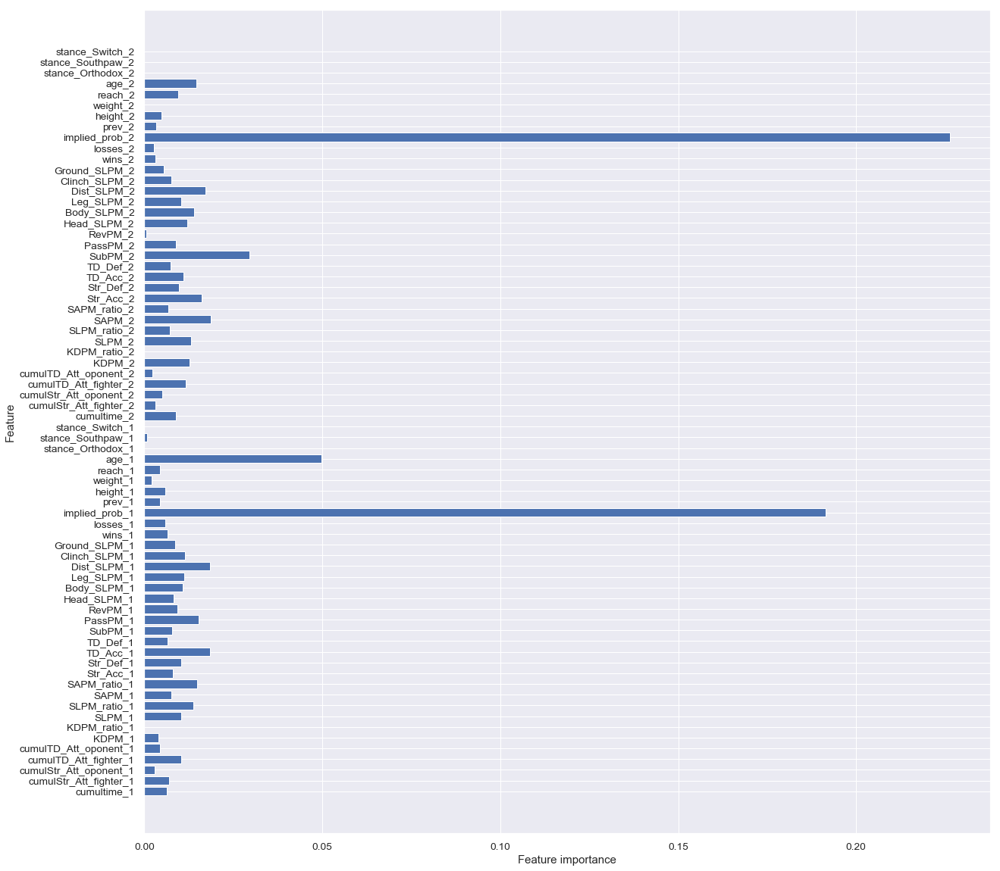

In [278]:
#importance of features
plot_feature_importances(forest2)

## Using the Random Forest Model For Gambling

In [313]:
myprobas_xtest = pd.DataFrame(forest2.predict_proba(X_test))
myprobas_xtest

,0,1
0,0.294895,0.705105
1,0.320590,0.679410
2,0.434182,0.565818
3,0.466495,0.533505
4,0.436942,0.563058
5,0.476062,0.523938
6,0.764839,0.235161
7,0.490922,0.509078
8,0.477598,0.522402
9,0.320131,0.679869


In [308]:
tested_fights = real.loc[(X_test.index)]
tested_fights = tested_fights[['date', 'fighter_1', 'implied_prob_1', 'fighter_2', 'implied_prob_2', 'winner']]
tested_fights

,date,fighter_1,implied_prob_1,fighter_2,implied_prob_2,winner
1278,2015-09-26,Naoyuki-Kotani,0.271003,Kajan-Johnson,0.746269,2
1118,2019-02-09,Teruto-Ishihara,0.246914,Kyung-Ho-Kang,0.763359,2
118,2019-03-23,Randa-Markos,0.425532,Angela-Hill,0.574713,1
718,2017-05-28,Damian-Stasiak,0.131234,Pedro-Munhoz,0.877193,2
1053,2017-09-02,Bojan-Velickovic,0.350877,Darren-Till,0.666667,2
1027,2017-06-03,Nate-Marquardt,0.404858,Vitor-Belfort,0.606061,2
203,2015-07-11,Thomas-Almeida,0.877193,Brad-Pickett,0.143062,1
795,2016-12-10,Anthony-Pettis,0.400000,Max-Holloway,0.613497,2
636,2014-03-23,Fabio-Maldonado,0.259740,Gian-Villante,0.636943,1
1198,2018-02-24,Russell-Doane,0.317460,Rani-Yahya,0.666667,2


In [503]:
compare = pd.DataFrame()
compare['date'] = list(tested_fights['date'])
compare['fighter_1'] = list(tested_fights['fighter_1'])
compare['vegas_prob_1'] = list(tested_fights['implied_prob_1'])
compare['my_prob_1'] = list(myprobas_xtest[0])
compare['fighter_2'] = list(tested_fights['fighter_2'])
compare['vegas_prob_2'] = list(tested_fights['implied_prob_2'])
compare['my_prob_2'] = list(myprobas_xtest[1])
compare['winner'] = list(tested_fights['winner'])
compare = compare.sort_values(by='date')
compare

,date,fighter_1,vegas_prob_1,my_prob_1,fighter_2,vegas_prob_2,my_prob_2,winner
70,2013-04-27,Michael-Bisping,0.636943,0.660387,Alan-Belcher,0.222222,0.339613,1
69,2013-04-27,Jon-Jones,0.884956,0.779760,Chael-Sonnen,0.111111,0.220240,1
265,2013-05-18,Gleison-Tibau,0.704225,0.674401,John-Cholish,0.298507,0.325599,1
257,2013-05-25,Rick-Story,0.598802,0.481330,Mike-Pyle,0.400000,0.518670,2
210,2013-05-25,George-Roop,0.273224,0.293036,Brian-Bowles,0.735294,0.706964,1
246,2013-07-27,Tim-Means,0.289855,0.434390,Danny-Castillo,0.666667,0.565610,2
114,2013-07-27,Daron-Cruickshank,0.598802,0.517792,Yves-Edwards,0.363636,0.482208,1
12,2013-07-27,Justin-Salas,0.689655,0.672258,Aaron-Riley,0.312500,0.327742,1
43,2013-11-09,Vitor-Belfort,0.735294,0.710006,Dan-Henderson,0.266667,0.289994,1
159,2013-11-16,Josh-Koscheck,0.434783,0.495491,Tyron-Woodley,0.512821,0.504509,2


In [504]:
vegas_payout_1 = []
for i in list(compare['vegas_prob_1']):
    vegas_payout_1.append(1/i)
my_payout_1 = []
for i in list(compare['my_prob_1']):
    my_payout_1.append(1/i)

vegas_payout_2 = []
for i in list(compare['vegas_prob_2']):
    vegas_payout_2.append(1/i)
my_payout_2 = []
for i in list(compare['my_prob_2']):
    my_payout_2.append(1/i)
    
compare['vegas_payout_1'] = vegas_payout_1
compare['my_payout_1'] = my_payout_1

compare['vegas_payout_2'] = vegas_payout_2
compare['my_payout_2'] = my_payout_2

In [505]:
compare

,date,fighter_1,vegas_prob_1,my_prob_1,fighter_2,vegas_prob_2,my_prob_2,winner,vegas_payout_1,my_payout_1,vegas_payout_2,my_payout_2
70,2013-04-27,Michael-Bisping,0.636943,0.660387,Alan-Belcher,0.222222,0.339613,1,1.57,1.514264,4.50,2.944528
69,2013-04-27,Jon-Jones,0.884956,0.779760,Chael-Sonnen,0.111111,0.220240,1,1.13,1.282446,9.00,4.540501
265,2013-05-18,Gleison-Tibau,0.704225,0.674401,John-Cholish,0.298507,0.325599,1,1.42,1.482798,3.35,3.071260
257,2013-05-25,Rick-Story,0.598802,0.481330,Mike-Pyle,0.400000,0.518670,2,1.67,2.077579,2.50,1.928007
210,2013-05-25,George-Roop,0.273224,0.293036,Brian-Bowles,0.735294,0.706964,1,3.66,3.412548,1.36,1.414500
246,2013-07-27,Tim-Means,0.289855,0.434390,Danny-Castillo,0.666667,0.565610,2,3.45,2.302080,1.50,1.768002
114,2013-07-27,Daron-Cruickshank,0.598802,0.517792,Yves-Edwards,0.363636,0.482208,1,1.67,1.931276,2.75,2.073795
12,2013-07-27,Justin-Salas,0.689655,0.672258,Aaron-Riley,0.312500,0.327742,1,1.45,1.487524,3.20,3.051181
43,2013-11-09,Vitor-Belfort,0.735294,0.710006,Dan-Henderson,0.266667,0.289994,1,1.36,1.408439,3.75,3.448344
159,2013-11-16,Josh-Koscheck,0.434783,0.495491,Tyron-Woodley,0.512821,0.504509,2,2.30,2.018200,1.95,1.982126


In [506]:
compare

,date,fighter_1,vegas_prob_1,my_prob_1,fighter_2,vegas_prob_2,my_prob_2,winner,vegas_payout_1,my_payout_1,vegas_payout_2,my_payout_2
70,2013-04-27,Michael-Bisping,0.636943,0.660387,Alan-Belcher,0.222222,0.339613,1,1.57,1.514264,4.50,2.944528
69,2013-04-27,Jon-Jones,0.884956,0.779760,Chael-Sonnen,0.111111,0.220240,1,1.13,1.282446,9.00,4.540501
265,2013-05-18,Gleison-Tibau,0.704225,0.674401,John-Cholish,0.298507,0.325599,1,1.42,1.482798,3.35,3.071260
257,2013-05-25,Rick-Story,0.598802,0.481330,Mike-Pyle,0.400000,0.518670,2,1.67,2.077579,2.50,1.928007
210,2013-05-25,George-Roop,0.273224,0.293036,Brian-Bowles,0.735294,0.706964,1,3.66,3.412548,1.36,1.414500
246,2013-07-27,Tim-Means,0.289855,0.434390,Danny-Castillo,0.666667,0.565610,2,3.45,2.302080,1.50,1.768002
114,2013-07-27,Daron-Cruickshank,0.598802,0.517792,Yves-Edwards,0.363636,0.482208,1,1.67,1.931276,2.75,2.073795
12,2013-07-27,Justin-Salas,0.689655,0.672258,Aaron-Riley,0.312500,0.327742,1,1.45,1.487524,3.20,3.051181
43,2013-11-09,Vitor-Belfort,0.735294,0.710006,Dan-Henderson,0.266667,0.289994,1,1.36,1.408439,3.75,3.448344
159,2013-11-16,Josh-Koscheck,0.434783,0.495491,Tyron-Woodley,0.512821,0.504509,2,2.30,2.018200,1.95,1.982126


In [507]:
mytakes_1 = compare[compare['my_payout_1'] < compare['vegas_payout_1']*.9]
len(mytakes_1)

84

In [508]:
mytakes_1['mytake'] = 1

money_1takes = []
for i in list(mytakes_1.index):
    if mytakes_1['winner'][i]==1:
        money_1takes.append(100*mytakes_1['vegas_payout_1'][i]-100)
    else:
        money_1takes.append(-100)
mytakes_1['BET_win/lose'] = money_1takes

mytakes_1

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/Users/hmnathel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


,date,fighter_1,vegas_prob_1,my_prob_1,fighter_2,vegas_prob_2,my_prob_2,winner,vegas_payout_1,my_payout_1,vegas_payout_2,my_payout_2,mytake,BET_win/lose
246,2013-07-27,Tim-Means,0.289855,0.434390,Danny-Castillo,0.666667,0.565610,2,3.45,2.302080,1.50,1.768002,1,-100.0
159,2013-11-16,Josh-Koscheck,0.434783,0.495491,Tyron-Woodley,0.512821,0.504509,2,2.30,2.018200,1.95,1.982126,1,-100.0
23,2013-12-06,Caio-Magalhaes,0.350877,0.463635,Nick-Ring,0.636943,0.536365,1,2.85,2.156869,1.57,1.864402,1,185.0
8,2014-03-23,Fabio-Maldonado,0.259740,0.477598,Gian-Villante,0.636943,0.522402,1,3.85,2.093812,1.57,1.914234,1,285.0
254,2014-05-10,Tim-Means,0.259740,0.334581,Neil-Magny,0.735294,0.665419,2,3.85,2.988810,1.36,1.502813,1,-100.0
232,2014-06-28,Jeremy-Stephens,0.325733,0.462122,Cub-Swanson,0.680272,0.537878,2,3.07,2.163932,1.47,1.859157,1,-100.0
158,2014-07-19,Brad-Pickett,0.400000,0.498696,Ian-McCall,0.598802,0.501304,2,2.50,2.005231,1.67,1.994797,1,-100.0
248,2014-07-19,Zak-Cummings,0.131579,0.385738,Gunnar-Nelson,0.862069,0.614262,2,7.60,2.592431,1.16,1.627971,1,-100.0
51,2014-07-26,Clay-Guida,0.350877,0.426036,Dennis-Bermudez,0.617284,0.573964,2,2.85,2.347221,1.62,1.742269,1,-100.0
256,2014-07-26,Matt-Brown,0.200000,0.359201,Robbie-Lawler,0.740741,0.640799,2,5.00,2.783955,1.35,1.560552,1,-100.0


In [509]:
mytakes_2 = compare[compare['my_payout_2'] < compare['vegas_payout_2']*.9]
len(mytakes_2)

71

In [514]:
mytakes_2['mytake'] = 2

money_2takes = []
for i in list(mytakes_2.index):
    if mytakes_2['winner'][i]==2:
        money_2takes.append(100*mytakes_2['vegas_payout_2'][i]-100)
    else:
        money_2takes.append(-100)

mytakes_2['BET_win/lose'] = money_2takes
mytakes_2

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/Users/hmnathel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # Remove the CWD from sys.path while we load stuff.


,date,fighter_1,vegas_prob_1,my_prob_1,fighter_2,vegas_prob_2,my_prob_2,winner,vegas_payout_1,my_payout_1,vegas_payout_2,my_payout_2,mytake,BET_win/lose
70,2013-04-27,Michael-Bisping,0.636943,0.660387,Alan-Belcher,0.222222,0.339613,1,1.57,1.514264,4.50,2.944528,2,-100.0
69,2013-04-27,Jon-Jones,0.884956,0.779760,Chael-Sonnen,0.111111,0.220240,1,1.13,1.282446,9.00,4.540501,2,-100.0
257,2013-05-25,Rick-Story,0.598802,0.481330,Mike-Pyle,0.400000,0.518670,2,1.67,2.077579,2.50,1.928007,2,150.0
114,2013-07-27,Daron-Cruickshank,0.598802,0.517792,Yves-Edwards,0.363636,0.482208,1,1.67,1.931276,2.75,2.073795,2,-100.0
68,2013-11-16,Thales-Leites,0.621118,0.536760,Ed-Herman,0.369004,0.463240,1,1.61,1.863032,2.71,2.158706,2,-100.0
229,2013-12-06,Pat-Barry,0.628931,0.517316,Soa-Palelei,0.384615,0.482684,2,1.59,1.933053,2.60,2.071750,2,160.0
178,2014-01-25,Jeremy-Stephens,0.531915,0.469715,Darren-Elkins,0.465116,0.530285,1,1.88,2.128949,2.15,1.885780,2,-100.0
217,2014-09-13,Antonio-Silva,0.806452,0.701889,Andrei-Arlovski,0.208333,0.298111,2,1.24,1.424726,4.80,3.354459,2,380.0
91,2014-09-20,Katsunori-Kikuno,0.581395,0.443935,Sam-Sicilia,0.425532,0.556065,1,1.72,2.252581,2.35,1.798352,2,-100.0
73,2014-12-20,Erick-Silva,0.781250,0.733826,Mike-Rhodes,0.229885,0.266174,1,1.28,1.362721,4.35,3.756938,2,-100.0


In [515]:
sum(money_1takes)

-691.0000000000002

In [516]:
sum(money_2takes)

1382.0

In [517]:
sum(money_2takes + money_1takes)

691.0

In [522]:
takes_df = mytakes_1.append(mytakes_2)
takes_df = takes_df.sort_values(by='date')

In [531]:
takes_df

,date,fighter_1,vegas_prob_1,my_prob_1,fighter_2,vegas_prob_2,my_prob_2,winner,vegas_payout_1,my_payout_1,vegas_payout_2,my_payout_2,mytake,BET_win/lose
69,2013-04-27,Jon-Jones,0.884956,0.779760,Chael-Sonnen,0.111111,0.220240,1,1.13,1.282446,9.00,4.540501,2,-100.0
70,2013-04-27,Michael-Bisping,0.636943,0.660387,Alan-Belcher,0.222222,0.339613,1,1.57,1.514264,4.50,2.944528,2,-100.0
257,2013-05-25,Rick-Story,0.598802,0.481330,Mike-Pyle,0.400000,0.518670,2,1.67,2.077579,2.50,1.928007,2,150.0
246,2013-07-27,Tim-Means,0.289855,0.434390,Danny-Castillo,0.666667,0.565610,2,3.45,2.302080,1.50,1.768002,1,-100.0
114,2013-07-27,Daron-Cruickshank,0.598802,0.517792,Yves-Edwards,0.363636,0.482208,1,1.67,1.931276,2.75,2.073795,2,-100.0
159,2013-11-16,Josh-Koscheck,0.434783,0.495491,Tyron-Woodley,0.512821,0.504509,2,2.30,2.018200,1.95,1.982126,1,-100.0
68,2013-11-16,Thales-Leites,0.621118,0.536760,Ed-Herman,0.369004,0.463240,1,1.61,1.863032,2.71,2.158706,2,-100.0
23,2013-12-06,Caio-Magalhaes,0.350877,0.463635,Nick-Ring,0.636943,0.536365,1,2.85,2.156869,1.57,1.864402,1,185.0
229,2013-12-06,Pat-Barry,0.628931,0.517316,Soa-Palelei,0.384615,0.482684,2,1.59,1.933053,2.60,2.071750,2,160.0
178,2014-01-25,Jeremy-Stephens,0.531915,0.469715,Darren-Elkins,0.465116,0.530285,1,1.88,2.128949,2.15,1.885780,2,-100.0


In [530]:
takes_df.describe()

,vegas_prob_1,my_prob_1,vegas_prob_2,my_prob_2,winner,vegas_payout_1,my_payout_1,vegas_payout_2,my_payout_2,mytake,BET_win/lose
count,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000
mean,0.475636,0.496065,0.521018,0.503935,1.535484,2.703161,2.166050,2.523677,2.212035,1.458065,4.458065
std,0.213834,0.138475,0.213200,0.138475,0.500356,1.572842,0.567917,1.784421,0.866447,0.499853,173.622977
min,0.100000,0.269851,0.076982,0.207042,1.000000,1.070000,1.261100,1.110000,1.369584,1.000000,-100.000000
25%,0.285773,0.399422,0.377358,0.453983,1.000000,1.610000,1.831448,1.470000,1.665065,1.000000,-100.000000
50%,0.434783,0.468452,0.561798,0.531548,2.000000,2.300000,2.134689,1.780000,1.881299,1.000000,-100.000000
75%,0.621118,0.546017,0.680272,0.600578,2.000000,3.500000,2.503624,2.650000,2.202728,2.000000,139.000000
max,0.934579,0.792958,0.900901,0.730149,2.000000,10.000000,3.705742,12.990000,4.829948,2.000000,1199.000000


# XGBoost

In [179]:
booster = xgb.XGBClassifier(random_state=20)
booster.fit(X_train, y_train)
y_pred = booster.predict(X_test)
#Printing out results
print_metrics(y_test, y_pred)

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.5970149253731343
Recall Score: 0.6106870229007634
Accuracy Score: 0.6052631578947368
F1 Score: 0.6037735849056602

AUC is :0.61

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,81,54,135
1.0,51,80,131
All,132,134,266


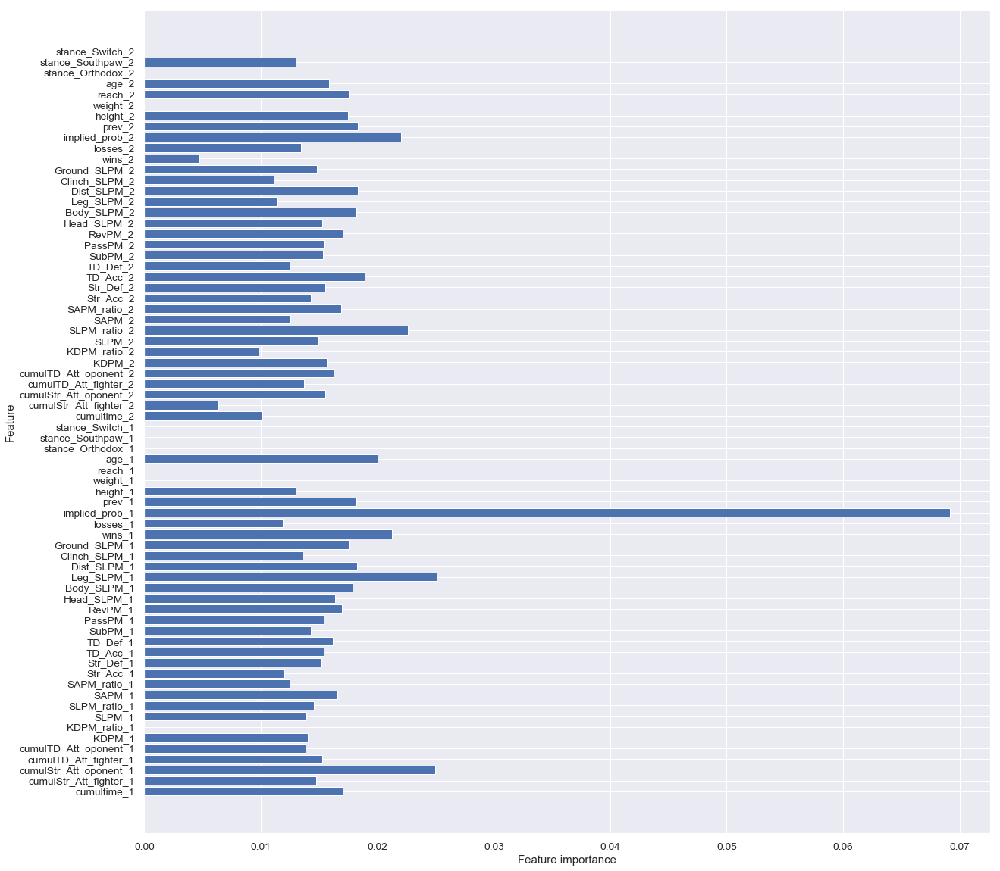

In [180]:
#importance of features
plot_feature_importances(booster)

In [186]:
param_distrib = {'max_depth': randint(1, 40),
                 'max_features': randint(1, 50),
                 'min_samples_split': randint(2, 700),
                 'min_samples_leaf': randint(2, 700),
                 'n_estimators': [10, 100]
                }
clf = RandomizedSearchCV(xgb.XGBClassifier(), param_distrib, n_iter=700)
clf.fit(X, y)
clf.best_params_

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


KeyboardInterrupt: 

In [ ]:
#running randomized search again
param_distrib = {'max_depth': randint(1, 40),
                 'max_features': randint(1, 50),
                 'min_samples_split': randint(2, 700),
                 'min_samples_leaf': randint(2, 700),
                 'n_estimators': [10, 100]
                }
clf = RandomizedSearchCV(xgb.XGBClassifier(), param_distrib, n_iter=700)
clf.fit(X, y)
clf.best_params_

In [ ]:
#running randomized search 3rd time
param_distrib = {'max_depth': randint(1, 40),
                 'max_features': randint(1, 50),
                 'min_samples_split': randint(2, 700),
                 'min_samples_leaf': randint(2, 700),
                 'n_estimators': [10, 100]
                }
clf = RandomizedSearchCV(xgb.XGBClassifier(), param_distrib, n_iter=700)
clf.fit(X, y)
clf.best_params_

In [110]:
#creating grid for grid search for random forest
xg_param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [20, 25, 30, 35, 40],
    'max_features': [20, 25, 30, 35, 40],
    'min_samples_split': [40, 50, 100, 200, 350],
    'min_samples_leaf': [40, 50, 100, 200, 350, 550],
    'n_estimators': [10, 30, 60, 100, 150, 200]
}

In [111]:
xg_grid_search = GridSearchCV(xgb.XGBClassifier(), xg_param_grid, cv=3, return_train_score=True, verbose=3)
xg_grid_search.fit(X, y)

Fitting 3 folds for each of 9000 candidates, totalling 27000 fits
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=10 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=10 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=10 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s remaining:    0.0s


[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.654), total=   0.7s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.638), total=   2.8s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.6s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.8s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.3s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.7s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   2.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   2.1s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.8s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   1.3s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.7s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.7s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   1.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   2.1s
[CV

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   2.0s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   1.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   2.0s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   2.0s
[CV

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.7s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.4s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.3s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.6s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   1.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   1.1s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   2.0s
[CV

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   2.1s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.7s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.6s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.6s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   1.0s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.4s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.4s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   2.1s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   1.2s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   2.1s
[CV

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.6s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   1.0s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   1.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.6s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   2.0s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   1.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.4s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.4s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   2.1s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.6s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.6s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   1.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), tot

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), tot

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), tot

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.64

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), tot

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=150, score=(train=1.000, test=0.597), total=   2.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.652), t

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=10, score=(train=0.994, test=0.581), total=  

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=150, score=(train=1.000, test=0.597), tot

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.604), tot

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=10, score=(train=0.997, test=0.670), to

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=150, score=(train=1.000, test=0.647), total=   1

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.649), total=   1

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=10, score=(train=0.997, test=0.670), total= 

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=1.000, test=0.647), total=   1

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.649), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=10, score=(train=0.997, test=0.670), total

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=1.000, test=0.647), tot

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.649), tot

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), total=   2.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.59

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.604), tota

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   2.0s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   2.1s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   1.1s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   2.0s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.5s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   1.0s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   1.0s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   2.1s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.6s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   2.0s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.5s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   2.0s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   2.0s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   1.1s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   2.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   2.1s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   1.1s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.5s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   2.0s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   2.0s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   1.0s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.3s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.3s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), tot

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   1.0s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), tot

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.59

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.590), total=   2.8s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), to

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.609), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604), total=   2.0s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   2.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.61

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), 

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.64

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.654), total=   0.6s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670), total

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), tot

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670), total

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), tot

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670)

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670)

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670)

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.590), total=   2.8s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670)

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604

[Parallel(n_jobs=1)]: Done 27000 out of 27000 | elapsed: 529.2min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0,
                                     learning_rate=0.1, max_delta_step=0,
                                     max_depth=3, min_child_weight=1,
                                     missing=None, n_estimators=100, n_jobs=1,
                                     nthread=None, objective='binary:logistic',
                                     random_state=0, reg_alpha=0, reg_l...
                                     subsample=1, verbosity=1),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [20, 25, 30, 35, 40],
                         'max_features': [20, 25, 30, 35, 40],
                         'min_samples_leaf': [40, 50, 100, 200, 350, 55

In [112]:
xg_gs_training_score = np.mean(xg_grid_search.cv_results_['mean_train_score'])
xg_gs_testing_score = xg_grid_search.score(X, y)

print("Mean Training Score: {:.4}%".format(xg_gs_training_score * 100))
print("Mean Testing Score: {:.4}%".format(xg_gs_testing_score * 100))
print("Best Parameter Combination Found During Grid Search:")
xg_grid_search.best_params_

Mean Training Score: 99.91%
Mean Testing Score: 99.7%
Best Parameter Combination Found During Grid Search:


{'criterion': 'gini',
 'max_depth': 20,
 'max_features': 20,
 'min_samples_leaf': 40,
 'min_samples_split': 40,
 'n_estimators': 10}

In [184]:
xg2 = xgb.XGBClassifier(criterion='gini',
                        max_depth=20,
                        max_features=20,
                        min_samples_leaf=40,
                        min_samples_split=40,
                        n_estimators=10,
                       randomstate=40)  
xg2.fit(X_train, y_train)
y_pred = xg2.predict(X_test)

#Printing out results
print_metrics(y_test, y_pred)

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.6240601503759399
Recall Score: 0.6335877862595419
Accuracy Score: 0.631578947368421
F1 Score: 0.6287878787878788

AUC is :0.63

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,85,50,135
1.0,48,83,131
All,133,133,266


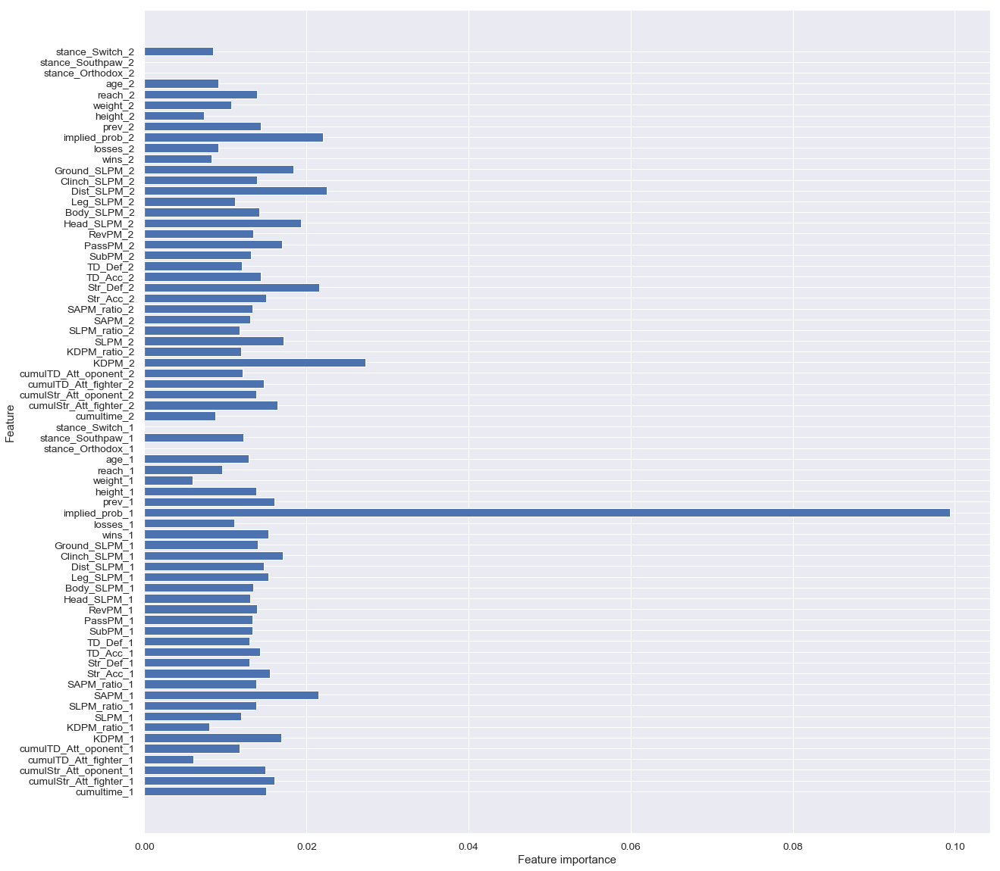

In [185]:
#importance of features
plot_feature_importances(xg2)